# Importing Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import tensorflow as tf
from pandas.plotting import lag_plot
import calendar
from math import sqrt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import Holt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import acf, pacf, plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, RepeatVector, TimeDistributed
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
import numpy as np
import tensorflow as tf
import pandas as pd
import plotly.graph_objects as go
import matplotlib.pyplot as plt


import warnings
warnings.filterwarnings('ignore',category=UserWarning)

# Import dataset

In [3]:
df=pd.read_csv('train.csv')
train=df.copy()

# Data Overview

In [4]:
train.shape

(3000888, 6)

In [5]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


In [7]:
train.dtypes

id               int64
date            object
store_nbr        int64
family          object
sales          float64
onpromotion      int64
dtype: object

In [8]:
# Missing value

In [9]:
train.isnull().sum()

id             0
date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64

# Descriptive Statistics

In [10]:
train.describe()

,id,store_nbr,sales,onpromotion
count,3.000888e+06,3.000888e+06,3.000888e+06,3.000888e+06
mean,1.500444e+06,2.750000e+01,3.577757e+02,2.602770e+00
std,8.662819e+05,1.558579e+01,1.101998e+03,1.221888e+01
min,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
25%,7.502218e+05,1.400000e+01,0.000000e+00,0.000000e+00
50%,1.500444e+06,2.750000e+01,1.100000e+01,0.000000e+00
75%,2.250665e+06,4.100000e+01,1.958473e+02,0.000000e+00
max,3.000887e+06,5.400000e+01,1.247170e+05,7.410000e+02


# Visualization

# Impact of Promotions on Sales

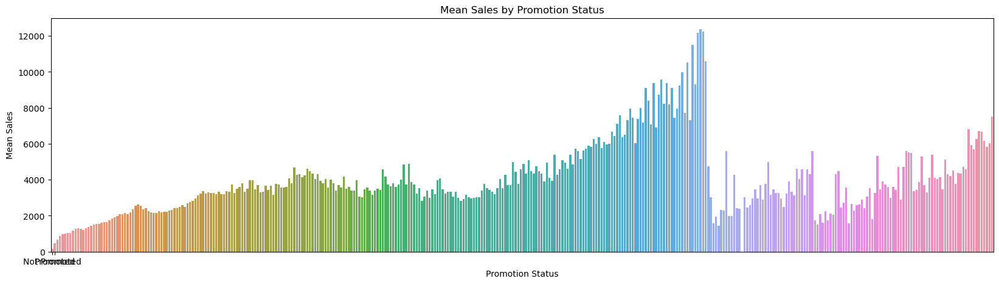

In [11]:
# Calculate mean sales for promoted and non-promoted products
mean_sales = train.groupby('onpromotion')['sales'].mean()

# Plot the mean sales
plt.figure(figsize=(20, 5))
sns.barplot(x=mean_sales.index, y=mean_sales.values)
plt.title('Mean Sales by Promotion Status')
plt.xlabel('Promotion Status')
plt.ylabel('Mean Sales')
plt.gca().set_xticks([0, 1])
plt.gca().set_xticklabels(['Not Promoted', 'Promoted'])
plt.show()

# Correlation Analysis

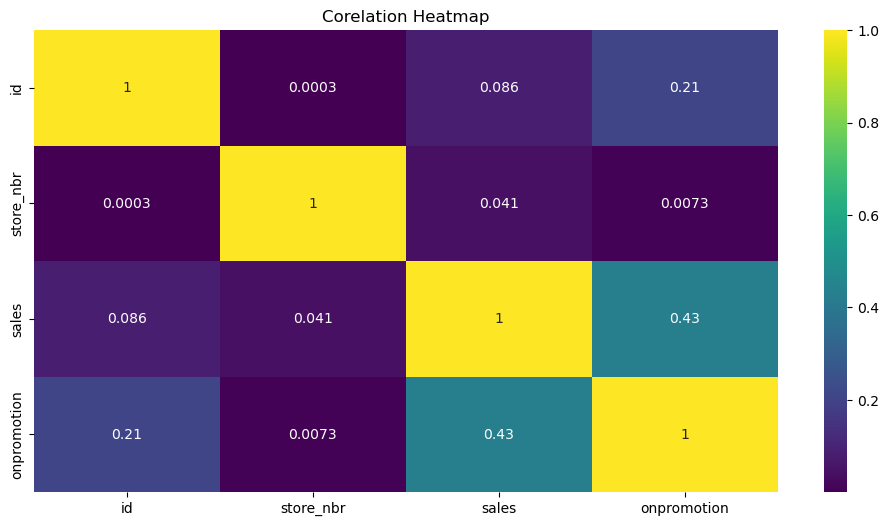

Correlations with 'sales':
sales          1.000000
onpromotion    0.427923
id             0.085784
store_nbr      0.041196
Name: sales, dtype: float64


In [12]:
corr_matrix=train.corr()
plt.figure(figsize=(12,6))
sns.heatmap(data=corr_matrix,annot=True,cmap='viridis')
plt.title('Corelation Heatmap')
plt.show()

#Explore Corelation With Sales
sales_corr = corr_matrix['sales'].sort_values(ascending=False)
print("Correlations with 'sales':")
print(sales_corr)

# Box Plot Visualization

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


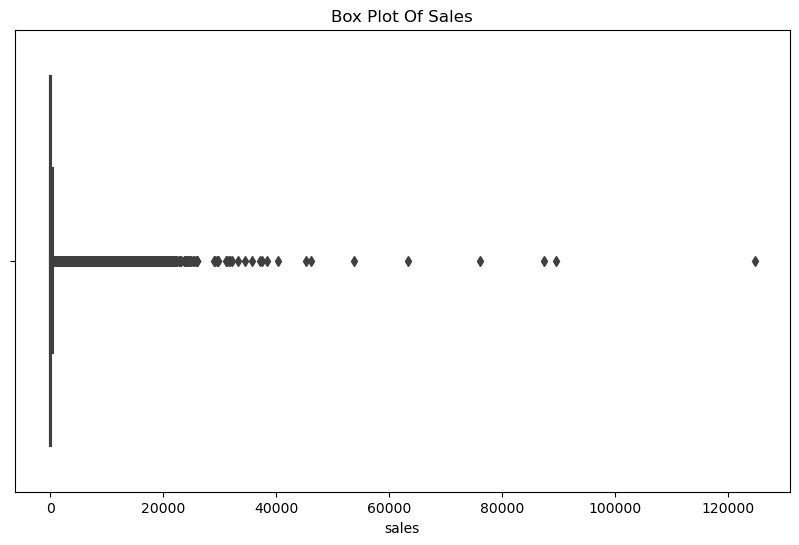

In [13]:
#identification of outliers by using boxplot and z-score
plt.figure(figsize=(10,6))
sns.boxplot(train['sales'])
plt.title('Box Plot Of Sales')
plt.show()

z_scores=(train['sales']-train['sales'].mean())/train['sales'].std()
outliers=train[abs(z_scores)>3]

# Top 10 Products

In [14]:
data_fa_sa=train.groupby('family').agg({'sales': "mean"}).reset_index().sort_values(by='sales',
                                                                                  ascending=False)[:10]
data_fa_sa['color'] = '#71c7ec'
data_fa_sa['color'][2:] = '#107dac'
trace= go.Bar(x=data_fa_sa['sales'], y=data_fa_sa['family'],
               marker=dict(color= data_fa_sa['color']),
               name='Family', orientation='h')

fig = go.Figure(data = trace)
fig.layout.update({'title': 'Top 10 Product Sales'})
fig.layout.update({'width':700,'height':400})
fig.update_yaxes(showgrid=False, ticksuffix=' ', categoryorder='total ascending')
fig.update_xaxes(visible=False)
fig.update_layout(title_x=0.5)
fig.show()

C:\Users\Dell\AppData\Local\Temp\ipykernel_21916\368512498.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_fa_sa['color'][2:] = '#107dac'


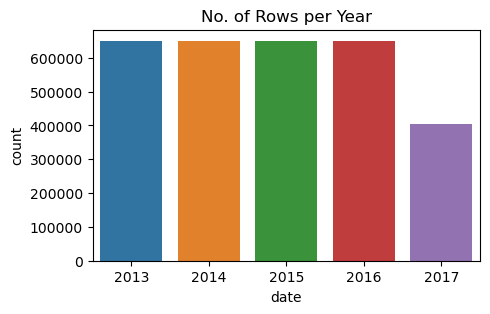

In [15]:
dst=pd.read_csv('train.csv')
plt.figure(figsize=(5, 3))
sns.countplot(x=pd.to_datetime(dst.date).dt.year)
plt.title('No. of Rows per Year')
plt.show();

<AxesSubplot:xlabel='store_nbr', ylabel='sales'>

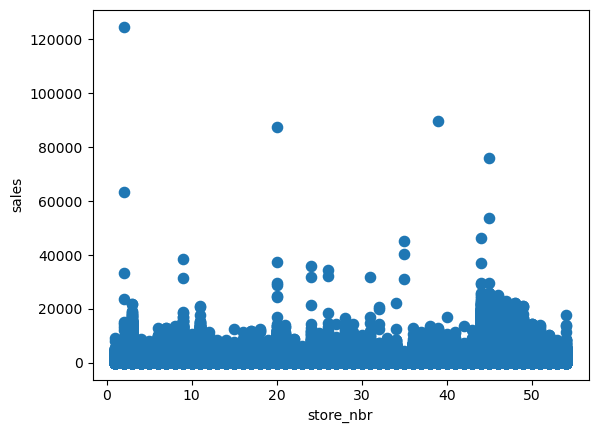

In [16]:
train.plot.scatter(x="store_nbr", y="sales", cmap="viridis", s=54)

# EDA Using DTALE Liabrary

In [17]:
!pip install dtale

In [18]:
import dtale 

In [19]:
dtale.show(train)

# Store and Product Family Analysis


In [20]:
# Explore the Unique Value and count of 'store_nbr' and'Family' columns
unique_stores=df['store_nbr'].nunique()
unique_stores_num=df['store_nbr'].nunique()

unique_families=df['family'].nunique()
print('Unique Store Number :',unique_stores)
print('Unique Store Families :',unique_families)

Unique Store Number : 54
Unique Store Families : 33


# Data Preprocessing

In [21]:
df1=train.copy()

In [22]:
def create_date_features(df1):
    # Convert 'date' column to datetime type

    df1['WeekofYear'] = df1['date'].dt.isocalendar().week
    df1['Year'] = df1['date'].dt.year
    df1['Day'] = df1['date'].dt.day
    df1['Month'] = df1['date'].dt.month
    df1['day_of_month'] = df1['date'].dt.day
    df1['day_of_year'] = df1['date'].dt.dayofyear
    df1['day_of_week'] = df1['date'].dt.dayofweek

    df1['WeekofYear'] = df1['WeekofYear'].astype('uint8')
    df1['Month'] = df1['Month'].astype('uint8')
    df1['Year'] = df1['Year'].astype('uint16')
    df1['Day'] = df1['Day'].astype('uint8')
    df1['day_of_month'] = df1['day_of_month'].astype('uint16')
    df1['day_of_year'] = df1['day_of_year'].astype('uint16')
    df1['day_of_week'] = df1['day_of_week'].astype('uint16')
    return df1

In [23]:
# df1 = create_date_features(df1)

# Label Encoding

In [24]:
from sklearn.preprocessing import LabelEncoder
le= LabelEncoder()

In [25]:
df['family']= le.fit_transform(df['family'])

In [26]:
df1.tail(5)

,id,date,store_nbr,family,sales,onpromotion
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8
3000887,3000887,2017-08-15,9,SEAFOOD,16.000,0


# Resampling data 


In [27]:
# Convert the 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Set date as the index for time series analysis
df.set_index('date', inplace=True)

# 1. Monthly wise

In [31]:
# Convert the 'date' column to datetime format
train['date'] = pd.to_datetime(train['date'])

# Set date as the index for time series analysis
train.set_index('date', inplace=True)

In [32]:
monthly_sales = train.resample('MS').mean()

# 2. Daily wise

In [33]:
Daily_sales = train.resample('D').mean()

In [34]:
import pandas as pd
Daily_sales = df.resample('D').mean()

# Visualizing Sales Time Series Data

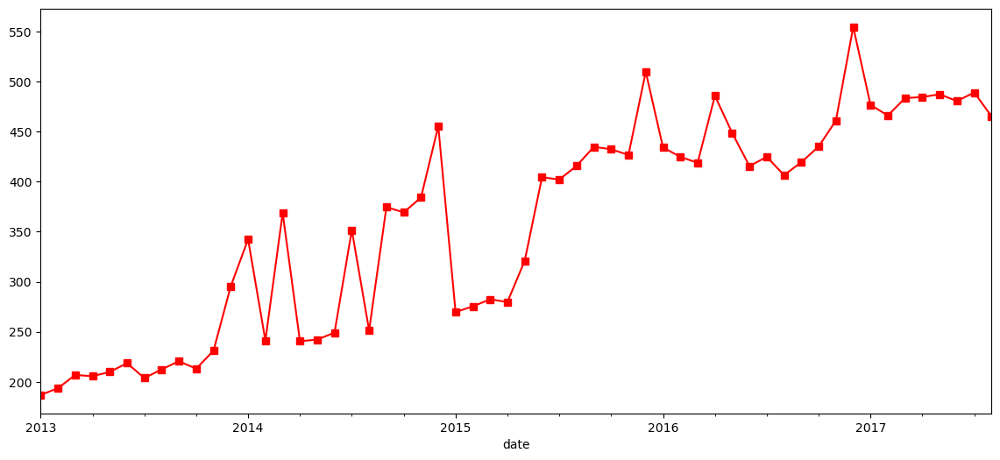

In [36]:
monthly_sales['sales'].plot(figsize=(14,6), color='red', marker='s')
plt.show()

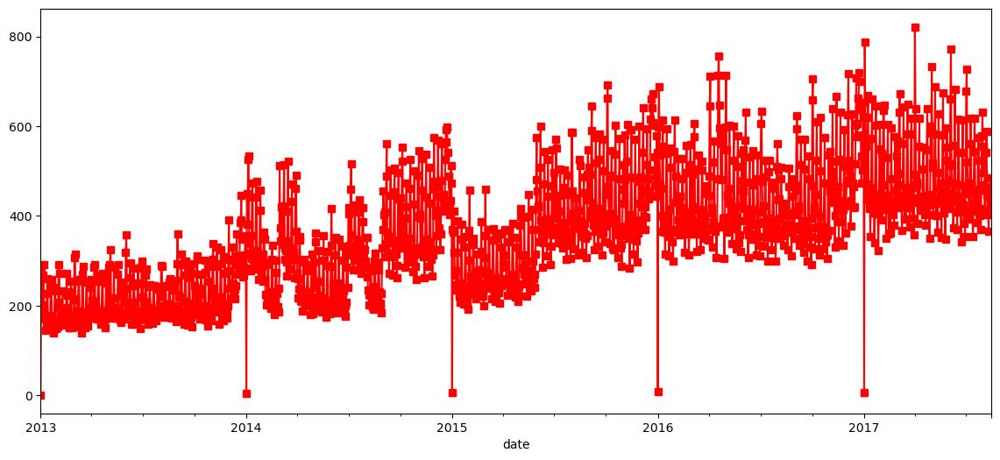

In [37]:
Daily_sales['sales'].plot(figsize=(14,6), color='red', marker='s')
plt.show()

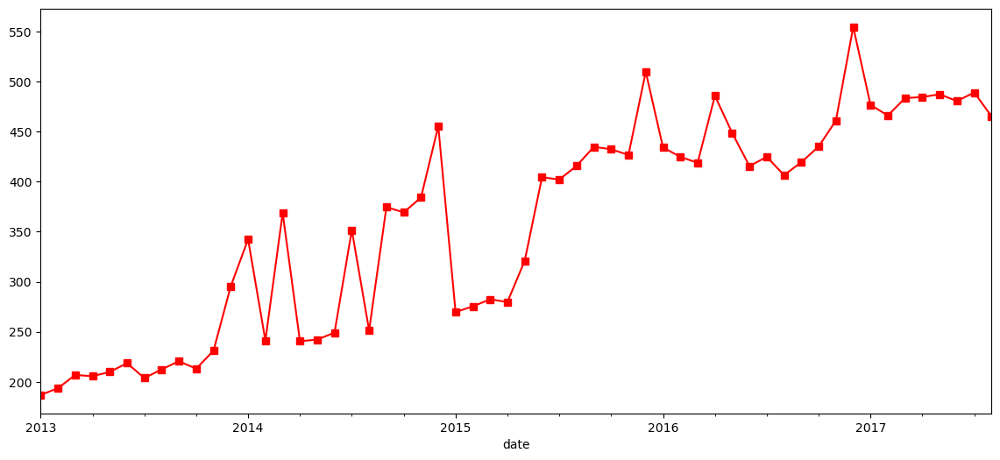

In [38]:
monthly_sales['sales'].plot(figsize=(14,6), color='red', marker='s')
plt.show()

In [43]:
# plt.figure(figsize=(12,4))
# sns.lineplot(X="Year",y='sales',data=train)

# ACF AND PACF PLOT
## Autocorrelation (ACF) Plot for Resampled Sales¶

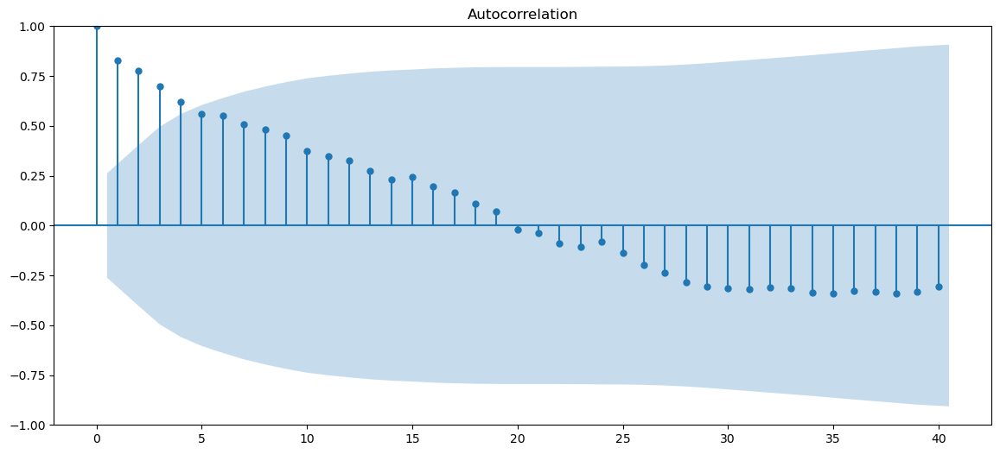

In [44]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(14,6))
    tsa_plots.plot_acf(monthly_sales['sales'],lags=40)
    plt.show()

# Partial Autocorrelation (PACF) Plot for Resampled Sales¶

C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



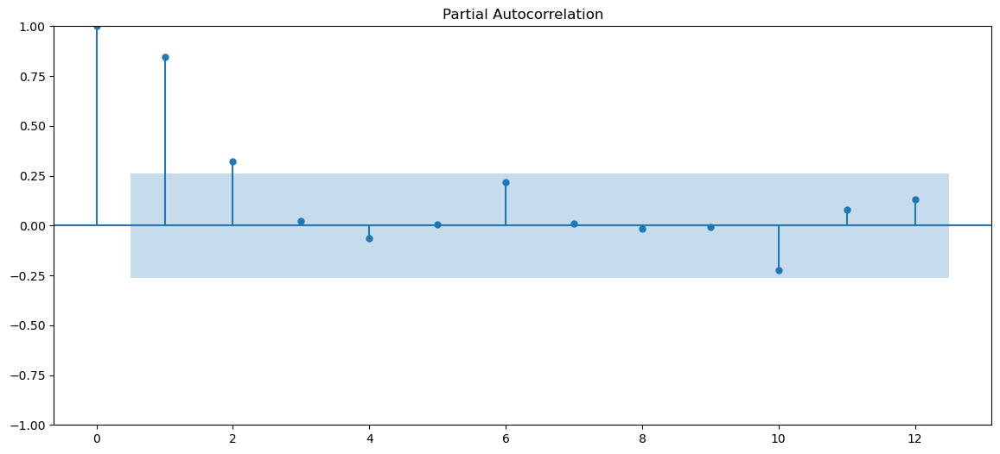

In [45]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(14,6))
    tsa_plots.plot_pacf(monthly_sales['sales'],lags=12)
    plt.show()

# Time Series Decomposition
## 1. Seasonality
## 2. Trend

## Additive Seasonal Decomposition

In [46]:
from pylab import rcParams

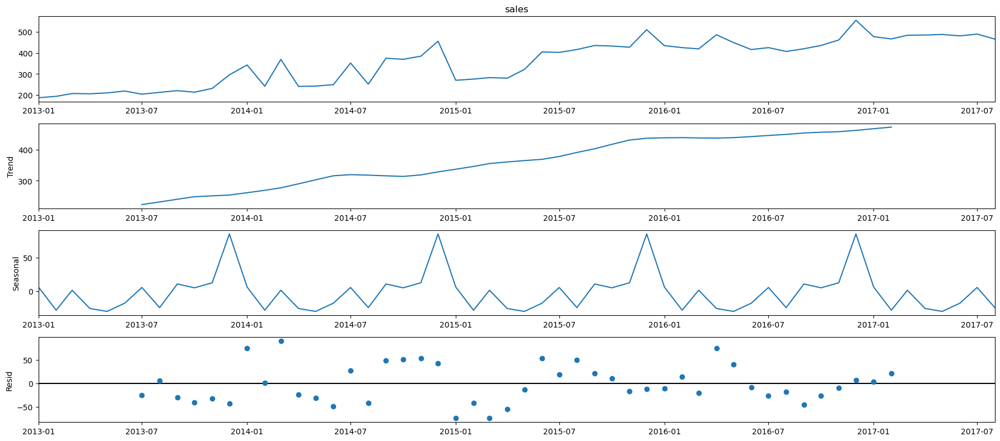

In [48]:
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(monthly_sales['sales'], model='additive')
fig = decomposition.plot()
plt.show()

# Multiplicative Seasonal Decomposition

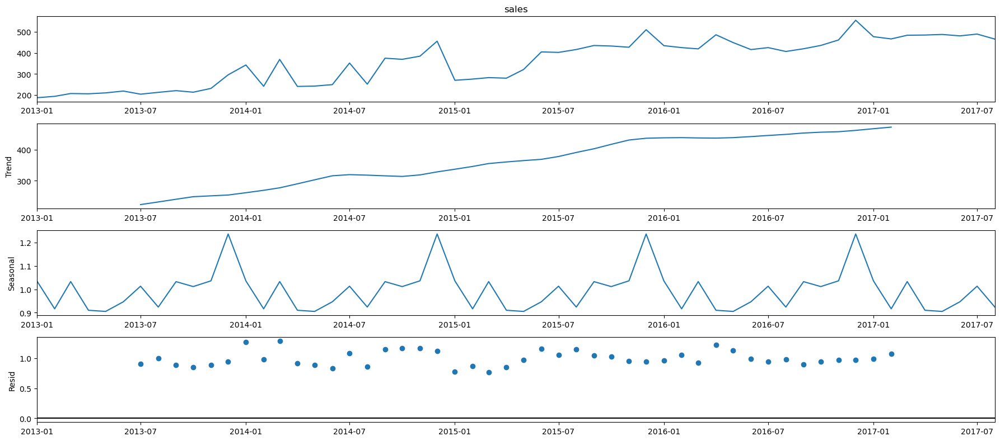

In [49]:
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(monthly_sales['sales'], model='multiplicative')
fig = decomposition.plot()
plt.show()

In [50]:
monthly_sales.shape

(56, 4)

In [51]:
Daily_sales.shape

(1688, 5)

# Train Test Split

# Train Test Split Monthly Dataset

In [52]:
from sklearn.model_selection import train_test_split
size = 44
training_mon = monthly_sales[:size]
testing_mon = monthly_sales[size:]


In [62]:
testing=testing_mon.copy()
training=training_mon.copy()

# Train Test Split Dailywise Dataset

In [53]:
size = 1323
training_daily = Daily_sales[:size]
testing_daily = Daily_sales[size:]

In [55]:
testing_mon.shape

(12, 4)

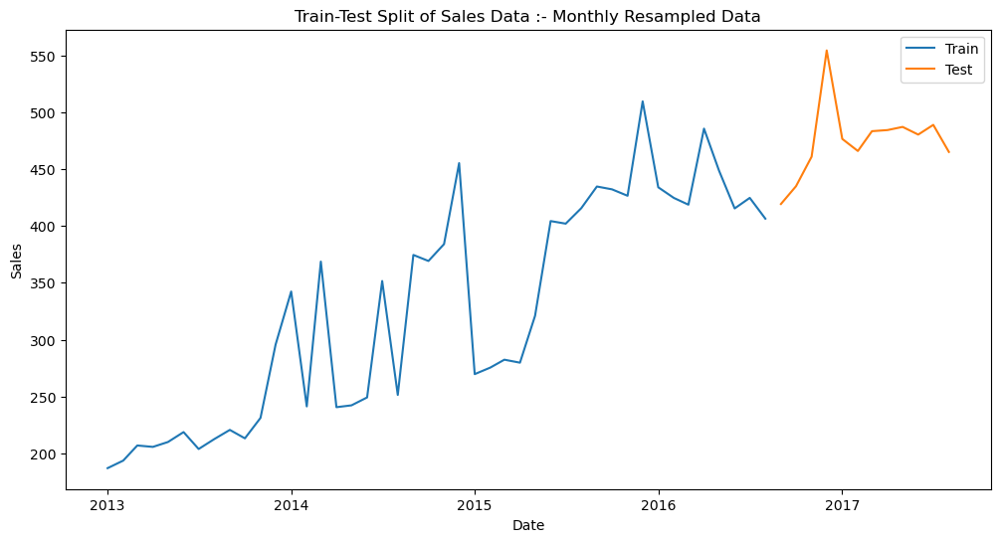

In [57]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(training_mon.index, training_mon['sales'], label='Train')
plt.plot(testing_mon.index, testing_mon['sales'] ,label='Test')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Train-Test Split of Sales Data :- Monthly Resampled Data')
plt.legend()
plt.show()

# Evaluation Metric MAPE

In [58]:
def MAPE(pred,org):
    temp = np.abs((pred-org)/org)*100
    return np.mean(temp)

# Moving Averages

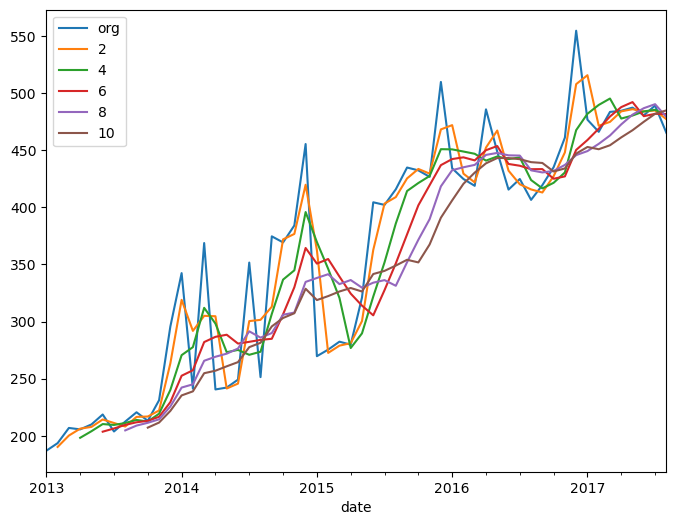

In [59]:
plt.figure(figsize=(8,6))
monthly_sales['sales'].plot(label="org")
for i in range(2,12,2):
    monthly_sales['sales'].rolling(i).mean().plot(label=str(i))
plt.legend(loc='best')

<AxesSubplot:xlabel='date'>

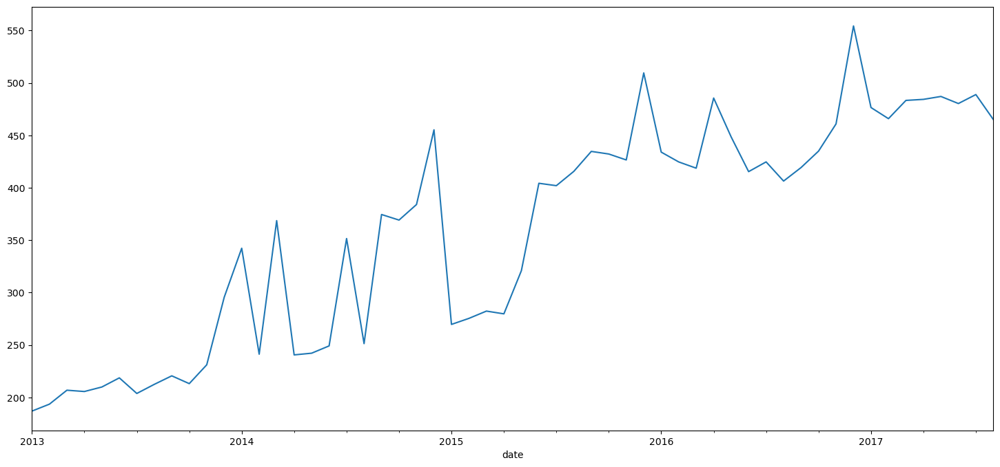

In [60]:
monthly_sales['sales'].plot()

# Exponential Methods
# Simple Exponential Method
# Using Forecast Attribute

In [63]:
ses_model = SimpleExpSmoothing(training['sales']).fit(optimized=True)
test_pred_ses = ses_model.forecast(12)
train_pred_ses = ses_model.fittedvalues
test_rmse_ses = sqrt(mean_squared_error(test_pred_ses,testing['sales']))
train_rmse_ses = sqrt(mean_squared_error(train_pred_ses,training['sales']))
mape_ses = MAPE(test_pred_ses,testing['sales'])
print('Simple Exponential Method Evaluation',"\n",\
'Mean Absolute Percent Error   = {}'.format(mape_ses),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ses),"\n",
'Test Root Mean Squared Error  = {}'.format(test_rmse_ses))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error   = 11.719759966050413 
 Train Root Mean Squared Error = 52.86011841553661 
 Test Root Mean Squared Error  = 65.54528632903032


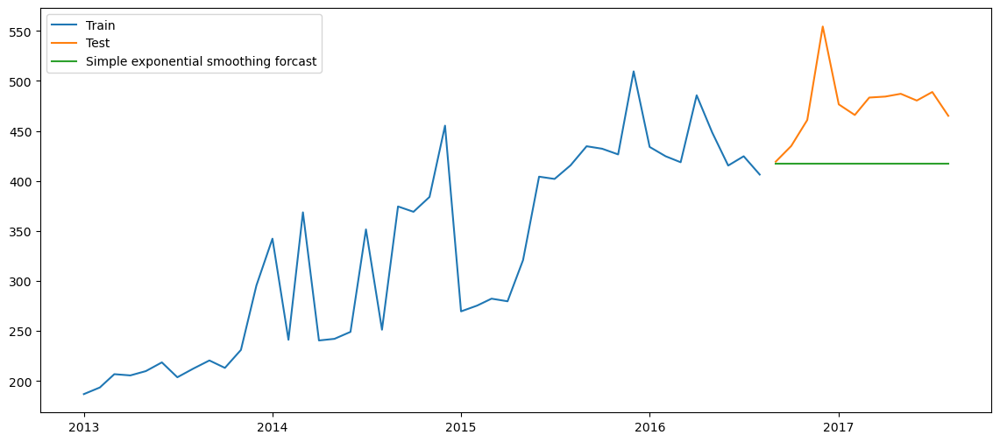

In [64]:
plt.figure(figsize=(14,6))
plt.plot(training['sales'], label='Train')
plt.plot(testing['sales'], label='Test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.legend(loc='best')
plt.show()

## Observation
No seasonality captures.
Most recent observation gets higher weightages than the older ones for forecasting.

# Holt method (Double Exponential)
# Captures both Level and Trend

In [65]:
dexp_model  = Holt(training['sales']).fit(optimized=True)
test_pred_dexp = dexp_model.forecast(12)
train_pred_dexp = dexp_model.fittedvalues
test_rmse_dexp = sqrt(mean_squared_error(test_pred_dexp,testing['sales']))
train_rmse_dexp = sqrt(mean_squared_error(train_pred_dexp,training['sales']))
mape_dexp = MAPE(test_pred_dexp,training['sales'])
print('Simple Exponential Method Evaluation',"\n",\
'Mean Absolute Percent Error   = {}'.format(mape_dexp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_dexp),"\n",
'Test Root Mean Squared Error  = {}'.format(test_rmse_dexp))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error   = nan 
 Train Root Mean Squared Error = 48.1928432586328 
 Test Root Mean Squared Error  = 47.0742607846734


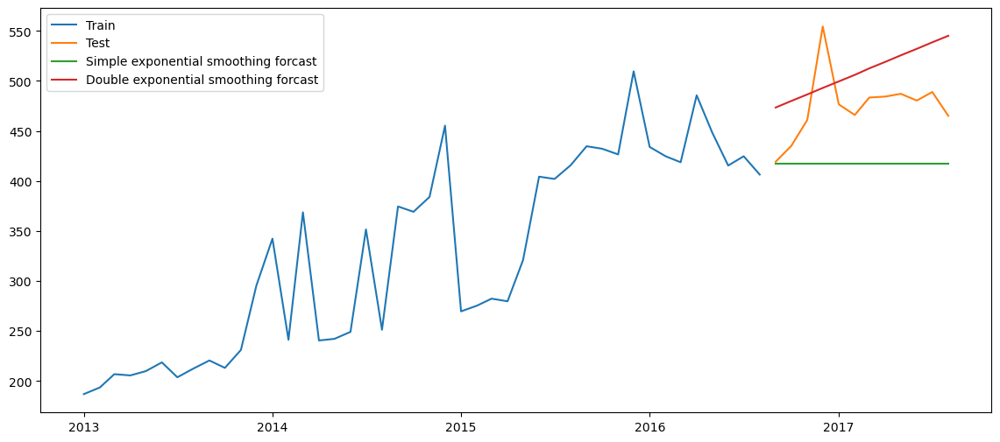

In [66]:
plt.figure(figsize=(14,6))
plt.plot(training['sales'], label='Train')
plt.plot(testing['sales'], label='Test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.legend(loc='best')
plt.show()

Observation
We can see that we are able to capture the trend of the data.
We were not able to capture the seasonality

# Holts winter exponential smoothing with additive seasonality and trend (Triple Exponential)
# Captures Level, Trend and Seasonality

In [67]:
texp_add_model  = ExponentialSmoothing(training['sales'],seasonal="add",trend="add",seasonal_periods=12).fit(optimized=True)
test_pred_ad_texp = texp_add_model.forecast(12)
train_pred_ad_texp = texp_add_model.fittedvalues
test_rmse_ad_texp = sqrt(mean_squared_error(test_pred_ad_texp,testing['sales']))
train_rmse_ad_texp = sqrt(mean_squared_error(train_pred_ad_texp,training['sales']))
mape_ad_texp = MAPE(test_pred_ad_texp,testing['sales'])
print('Triple Exponential with Additive Trend and Seosonality Method Evaluation',"\n",\
'Mean Absolute Percent Error   = {}'.format(mape_ad_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_texp),"\n",
'Test Root Mean Squared Error  = {}'.format(test_rmse_ad_texp))

Triple Exponential with Additive Trend and Seosonality Method Evaluation 
 Mean Absolute Percent Error   = 7.689319463331099 
 Train Root Mean Squared Error = 39.626565915088 
 Test Root Mean Squared Error  = 42.760071378109714


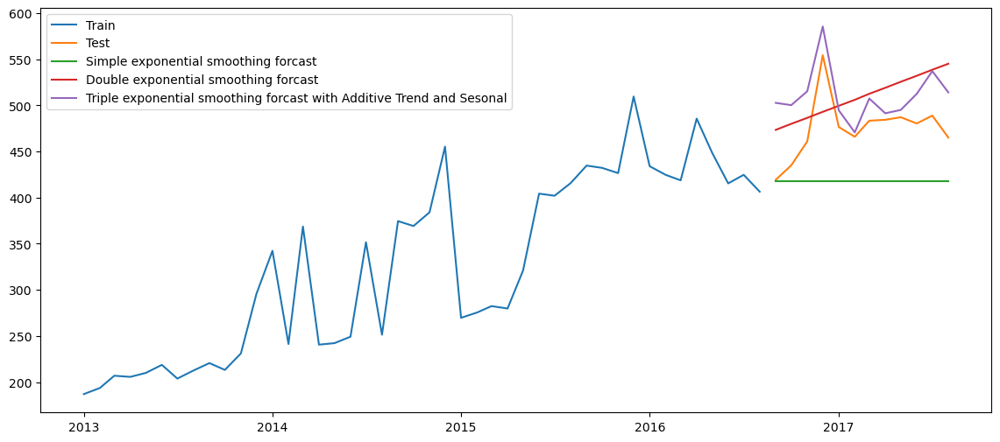

In [68]:
plt.figure(figsize=(14,6))
plt.plot(training['sales'], label='Train')
plt.plot(testing['sales'], label='Test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.legend(loc='best')
plt.show()

Observation
It captures the trend, which we can see that the forecasted values are lower level than the test level.
It also captures the seasonality.
The peak of the forecasted value is lower than the actual

# Holts winter exponential smoothing with multiplicative seasonality and additive trend (Triple Exponential)

In [69]:
texp_mul_ad_model  = ExponentialSmoothing(training['sales'],seasonal="mul",trend="add",seasonal_periods=12).fit(optimized=True)
test_pred_mul_ad_texp = texp_mul_ad_model.forecast(12)
train_pred_mul_ad_texp = texp_mul_ad_model.fittedvalues
test_rmse_mul_ad_texp = sqrt(mean_squared_error(test_pred_mul_ad_texp,testing['sales']))
train_rmse_mul_ad_texp = sqrt(mean_squared_error(train_pred_mul_ad_texp,training['sales']))
mape_mul_ad_texp = MAPE(test_pred_mul_ad_texp,testing['sales'])
print('Triple Exponential Method with Multiplicative Seasonality and Additive Trend',"\n",\
'Mean Absolute Percent Error   = {}'.format(mape_mul_ad_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_mul_ad_texp),"\n",
'Test Root Mean Squared Error  = {}'.format(test_rmse_mul_ad_texp))

Triple Exponential Method with Multiplicative Seasonality and Additive Trend 
 Mean Absolute Percent Error   = 8.835652068620005 
 Train Root Mean Squared Error = 38.42626891591227 
 Test Root Mean Squared Error  = 50.49665969582545


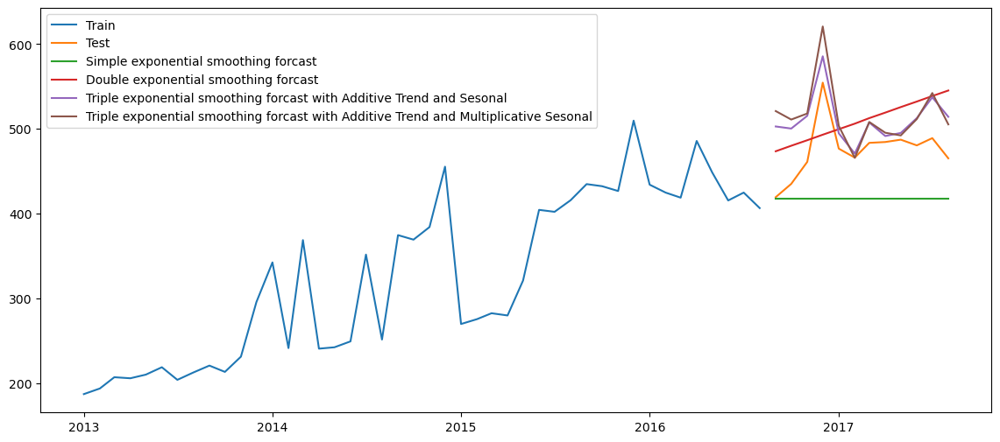

In [70]:
plt.figure(figsize=(14,6))
plt.plot(training['sales'], label='Train')
plt.plot(testing['sales'], label='Test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.legend(loc='best')
plt.show()

bservation
We can see that the errors have reduced drastically once we are able to capture the level, trend and seasonality altogether

# Holts winter exponential smoothing with Additive seasonality and multiplicative trend (Triple Exponential)

In [71]:
texp_ad_mul_model = ExponentialSmoothing(training['sales'],seasonal="add",trend="mul",
                    seasonal_periods=12).fit(smoothing_level=0.1, smoothing_slope=0.5)
test_pred_ad_mul_texp  = texp_ad_mul_model.forecast(12)
train_pred_ad_mul_texp  = texp_ad_mul_model.fittedvalues
test_rmse_ad_mul_texp  = sqrt(mean_squared_error(test_pred_ad_mul_texp ,testing['sales']))
train_rmse_ad_mul_texp  = sqrt(mean_squared_error(train_pred_ad_mul_texp ,training['sales']))
mape_ad_mul_texp  = MAPE(test_pred_ad_mul_texp,testing['sales'])
print('Triple Exponential Method with Additive Seasonality and Multiplicative Trend',"\n",\
'Mean Absolute Percent Error   = {}'.format(mape_ad_mul_texp ),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_mul_texp ),"\n",
'Test Root Mean Squared Error  = {}'.format(test_rmse_ad_mul_texp ))

Triple Exponential Method with Additive Seasonality and Multiplicative Trend 
 Mean Absolute Percent Error   = 11.058904074420822 
 Train Root Mean Squared Error = 48.11043099427231 
 Test Root Mean Squared Error  = 56.4940947533863


C:\Users\Dell\AppData\Local\Temp\ipykernel_21916\1407304959.py:1: FutureWarning:

the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.

C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:83: RuntimeWarning:

overflow encountered in matmul



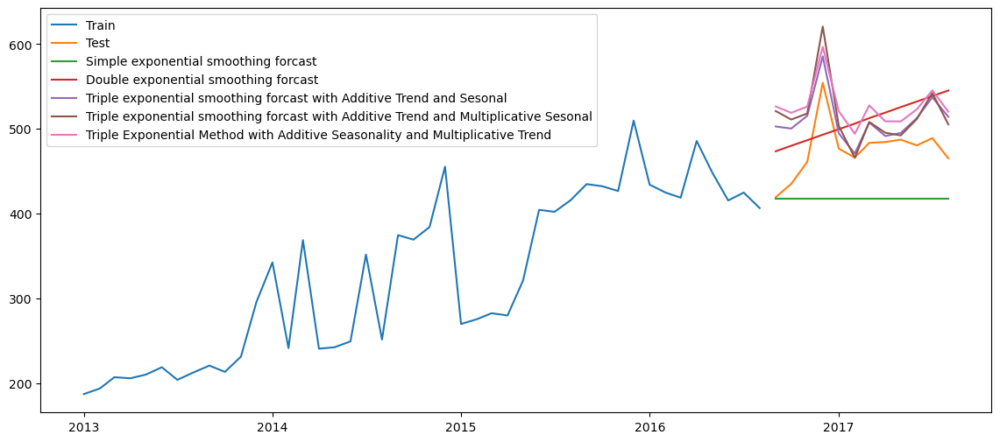

In [72]:
plt.figure(figsize=(14,6))
plt.plot(training['sales'], label='Train')
plt.plot(testing['sales'], label='Test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.plot(test_pred_ad_mul_texp, label='Triple Exponential Method with Additive Seasonality and Multiplicative Trend')
plt.legend(loc='best')
plt.show()

Observation
It captures the trend, which we can see that the forecasted values are higher level than the test level.
It also captures the seasonality.
The peak of the forecasted value is higher than the actual

# Holts winter exponential smoothing with multiplicative seasonality and multiplicative trend (Triple Exponential)

In [73]:
texp_mul_model  = ExponentialSmoothing(training['sales'],seasonal="mul",trend="mul",seasonal_periods=12).fit(optimized=True)
test_pred_mul_texp  = texp_mul_model.forecast(12)
train_pred_mul_texp  = texp_mul_model.fittedvalues
test_rmse_mul_texp  = sqrt(mean_squared_error(test_pred_mul_texp ,testing['sales']))
train_rmse_mul_texp  = sqrt(mean_squared_error(train_pred_mul_texp ,training['sales']))
mape_mul_texp  = MAPE(test_pred_mul_texp,testing['sales'])
print('Triple Exponential Method with multiplicative Trend and Seasonality',"\n",\
'Mean Absolute Percent Error   = {}'.format(mape_mul_texp ),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_mul_texp ),"\n",
'Test Root Mean Squared Error  = {}'.format(test_rmse_mul_texp ))

Triple Exponential Method with multiplicative Trend and Seasonality 
 Mean Absolute Percent Error   = 17.55961832525947 
 Train Root Mean Squared Error = 41.8581850377565 
 Test Root Mean Squared Error  = 86.97009257180255


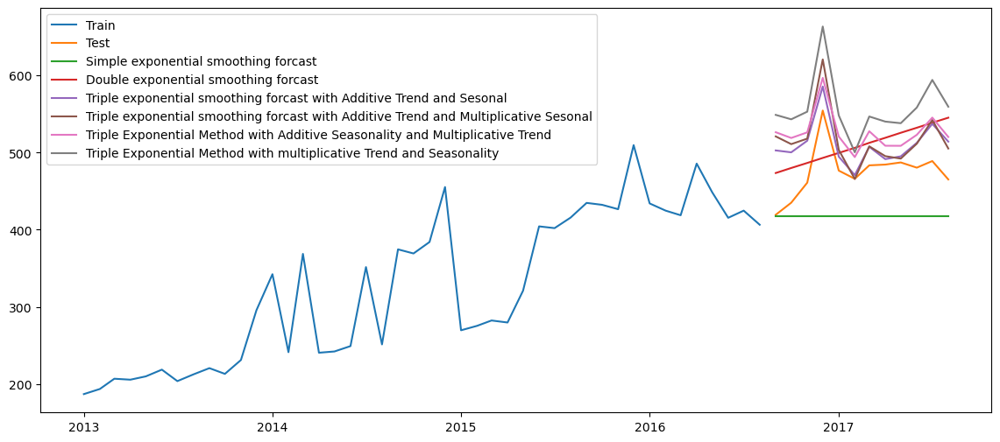

In [74]:
plt.figure(figsize=(14,6))
plt.plot(training['sales'], label='Train')
plt.plot(testing['sales'], label='Test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.plot(test_pred_ad_mul_texp, label='Triple Exponential Method with Additive Seasonality and Multiplicative Trend')
plt.plot(test_pred_mul_texp, label='Triple Exponential Method with multiplicative Trend and Seasonality')
plt.legend(loc='best')
plt.show()

# Data Stationary

In [75]:
def test_stationarity(datas):
    
    #Determine rolling statistics
    movingAverage = monthly_sales['sales'].rolling(window=12).mean()
    movingSTD = monthly_sales['sales'].rolling(window=12).std()
    
    #Plot rolling statistics
    orig = plt.plot(monthly_sales['sales'], color='blue', label='Original')
    mean = plt.plot(movingAverage, color='red', label='Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show(block=False)
    
    #Perform Dickey–Fuller test:
    print('Results of Dickey Fuller Test:')
    dftest = adfuller(monthly_sales['sales'], autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

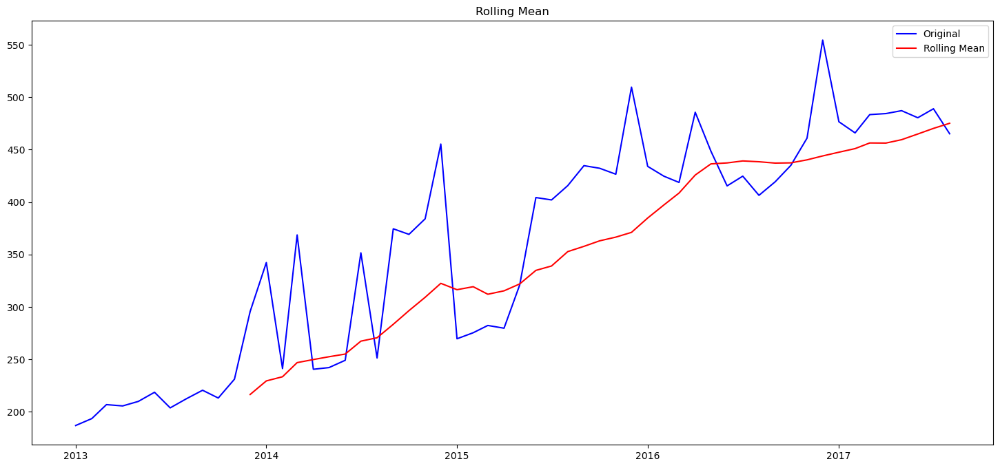

Results of Dickey Fuller Test:
Test Statistic                 -1.574664
p-value                         0.496307
#Lags Used                      1.000000
Number of Observations Used    54.000000
Critical Value (1%)            -3.557709
Critical Value (5%)            -2.916770
Critical Value (10%)           -2.596222
dtype: float64


In [76]:
test_stationarity(monthly_sales)

In [77]:
from statsmodels.tsa.stattools import adfuller
def adf_test(series):    
    result = adfuller(series.dropna())  
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)
    #for key,val in result[4].items():
        #out[f'critical value ({key})']=val
    if result[1] <= 0.05:
        print("Reject the null hypothesis")
        print("Data is stationary")
    else:
        print("Fail to reject the null hypothesis")
        print("Data is non-stationary")

In [78]:
adf_test(monthly_sales['sales'])

Fail to reject the null hypothesis
Data is non-stationary


# Converting Non-Stationary Time Series into Stationary
# Box Cox Transformation

,sales
date,
2013-01-01,5.230854
2013-02-01,5.265700
2013-03-01,5.332142
2013-04-01,5.326123
2013-05-01,5.346839


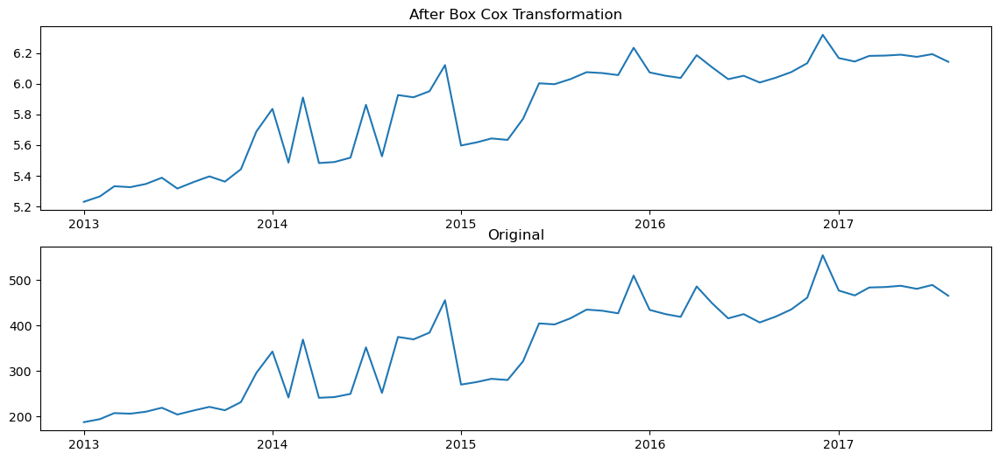

In [79]:
from scipy.stats import boxcox

# resampled_data = df1.resample('MS').sum()

# Apply Box-Cox transformation
data_boxcox = pd.DataFrame()
data_boxcox['sales'] = pd.Series(boxcox(monthly_sales['sales'], lmbda=0), index=monthly_sales.index)

# Display the transformed data
display(data_boxcox.head())

# Create comparison plots
fig, axis = plt.subplots(2, figsize=(14, 6))
axis[0].plot(data_boxcox, label='Box-Cox Transformed')
axis[0].set_title('After Box Cox Transformation')
axis[1].plot(monthly_sales['sales'], label='Original')
axis[1].set_title('Original')
plt.show()



Augmented Dickey-fuller test is a statistical test for stationarity. If the p-value is less than 0.05 then the series is  stationary. Here the p-value is 0.496 so, the time series is not stationary.

In [80]:
adf_test(data_boxcox)

Fail to reject the null hypothesis
Data is non-stationary


# Differencing of the Box-Cox Transformation
# Differencing is performed by subtracting the previous observation from the current observation.

# Differencing removes trend and seasonality in a Time series. When an entire cycle is used for differencing the other cycle, then the seasonality is removed.

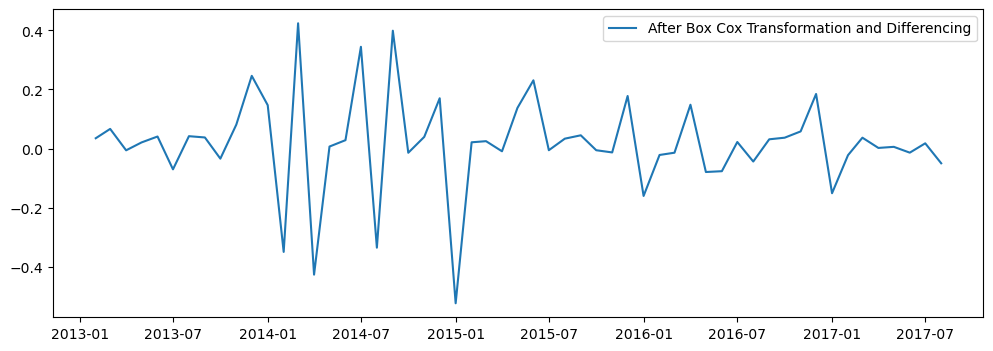

In [81]:
data_boxcox_diff = data_boxcox - data_boxcox.shift()
data_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(data_boxcox_diff, label='After Box Cox Transformation and Differencing')
plt.legend(loc='best')
plt.show()

Observation
We can see that there is no trend (upward or downward) after differencing on the Box Cox transformation.
It is a horizontal trend.
The mean became constant. The mean is zero.
Also, the variance is almost constant.
Lets test the Stationarity again.

In [82]:
adf_test(data_boxcox_diff)

Reject the null hypothesis
Data is stationary


# Model Building

<AxesSubplot:xlabel='date'>

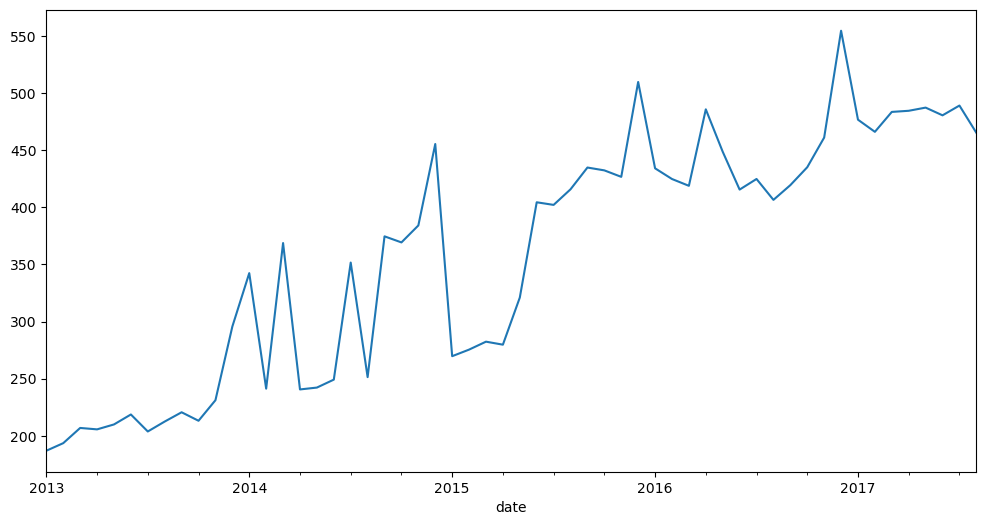

In [83]:
monthly_sales['sales'].plot(figsize=(12,6))

In [84]:

from keras.preprocessing.sequence import TimeseriesGenerator

In [85]:
# training
from sklearn.preprocessing import StandardScaler

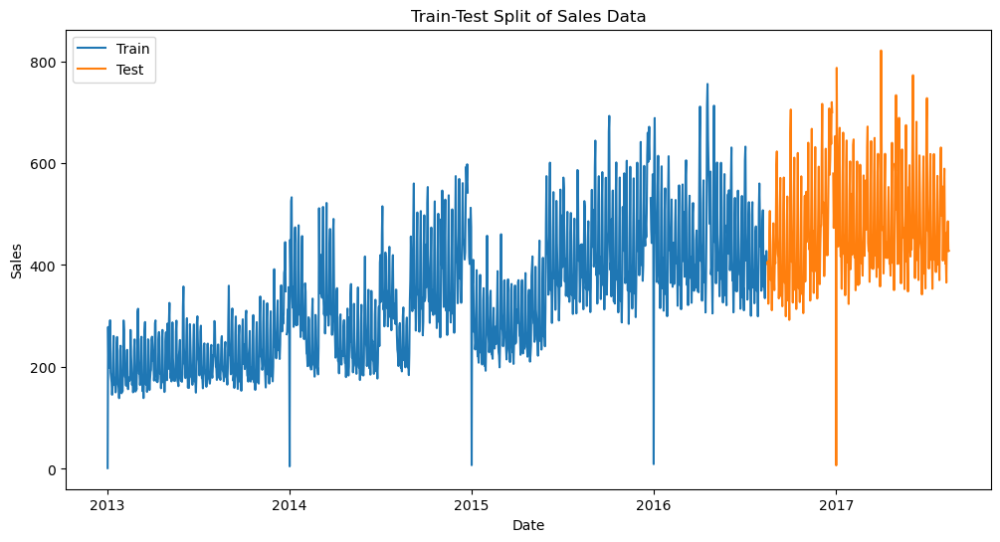

In [86]:
plt.figure(figsize=(12, 6))
plt.plot(training_daily.index, training_daily['sales'], label='Train')
plt.plot(testing_daily.index, testing_daily['sales'] ,label='Test')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Train-Test Split of Sales Data')
plt.legend()
plt.show()

3. Create sequences
Create sequences combining TIME_STEPS contiguous data values from the training data.
TIME_STEP is set 30 as we want our network to have memory of 30 days.

In [87]:
TIME_STEPS=30

def create_sequences(X, y, time_steps=TIME_STEPS):
    X_out, y_out = [], []
    for i in range(len(X)-time_steps):
        X_out.append(X.iloc[i:(i+time_steps)].values)
        y_out.append(y.iloc[i+time_steps])
    
    return np.array(X_out), np.array(y_out)

X_train, y_train = create_sequences(training_daily[['sales']], training_daily['sales'])
X_test, y_test = create_sequences(testing_daily[['sales']], testing_daily['sales'])
print("Training input shape: ", X_train.shape)
print("Testing input shape: ", X_test.shape)

Training input shape:  (1293, 30, 1)
Testing input shape:  (335, 30, 1)


In [88]:
training_daily['sales'].shape

(1323,)

In [89]:
testing_daily['sales'].shape

(365,)

# Build a model

# Train Model

,sales
date,
2013-01-01,0.343191
2013-01-02,5.629026
2013-01-03,5.312418
2013-01-04,5.292858
2013-01-05,5.590514


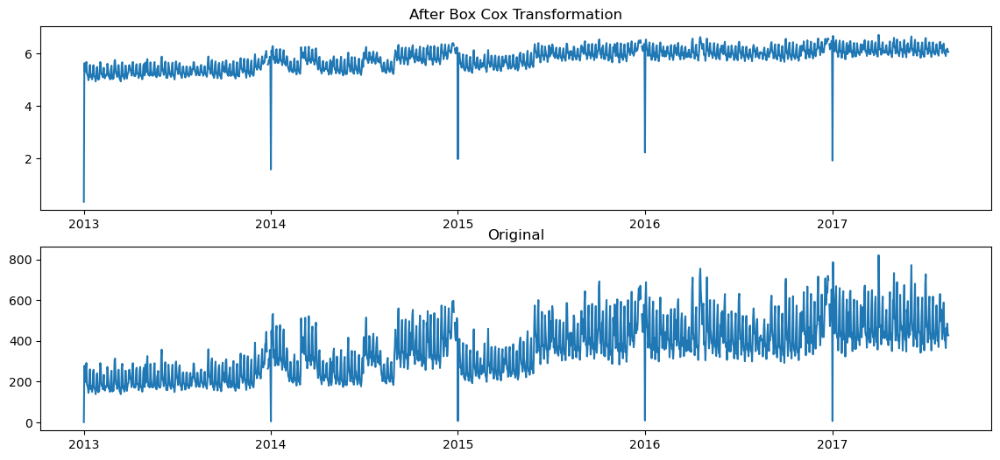

In [90]:
# Apply Box-Cox transformation
data_boxcox_daily = pd.DataFrame()
data_boxcox_daily['sales'] = pd.Series(boxcox(Daily_sales['sales'], lmbda=0), index=Daily_sales.index)

# Display the transformed data
display(data_boxcox_daily.head())

# Create comparison plots
fig, axis = plt.subplots(2, figsize=(14, 6))
axis[0].plot(data_boxcox_daily, label='Box-Cox Transformed')
axis[0].set_title('After Box Cox Transformation')
axis[1].plot(Daily_sales['sales'], label='Original')
axis[1].set_title('Original')
plt.show()

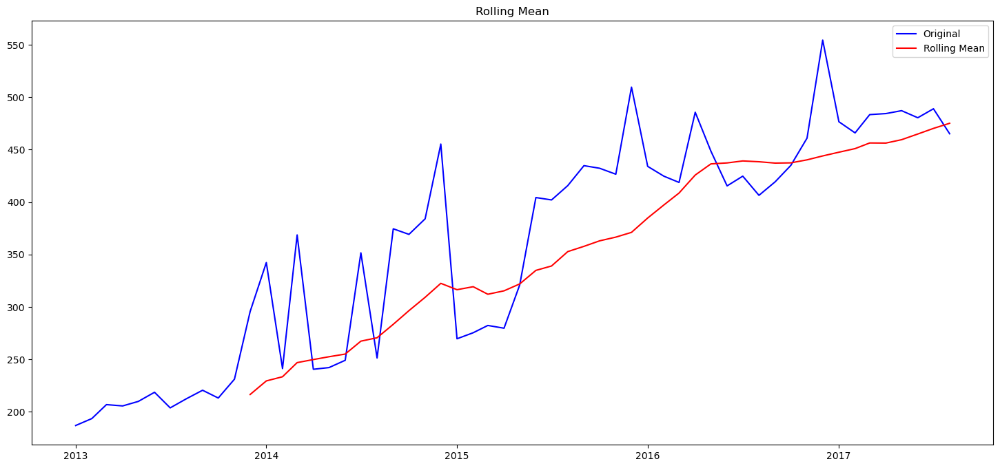

Results of Dickey Fuller Test:
Test Statistic                 -1.574664
p-value                         0.496307
#Lags Used                      1.000000
Number of Observations Used    54.000000
Critical Value (1%)            -3.557709
Critical Value (5%)            -2.916770
Critical Value (10%)           -2.596222
dtype: float64


In [91]:
test_stationarity(data_boxcox_daily)

In [92]:
adf_test(data_boxcox_daily)

Fail to reject the null hypothesis
Data is non-stationary


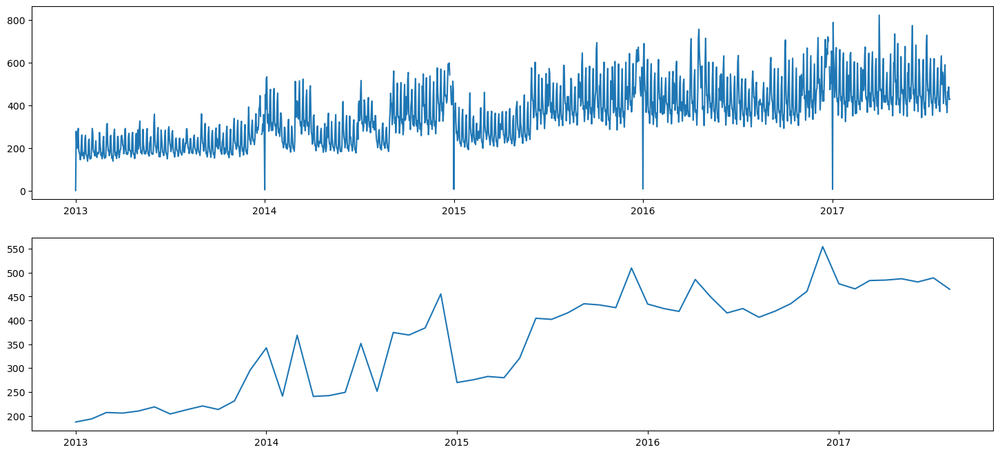

In [93]:
fig, axes = plt.subplots(2,1)
axes[0].plot(Daily_sales['sales'])
axes[1].plot(monthly_sales['sales'])

# violinplot of days of week and month to determine variance and range

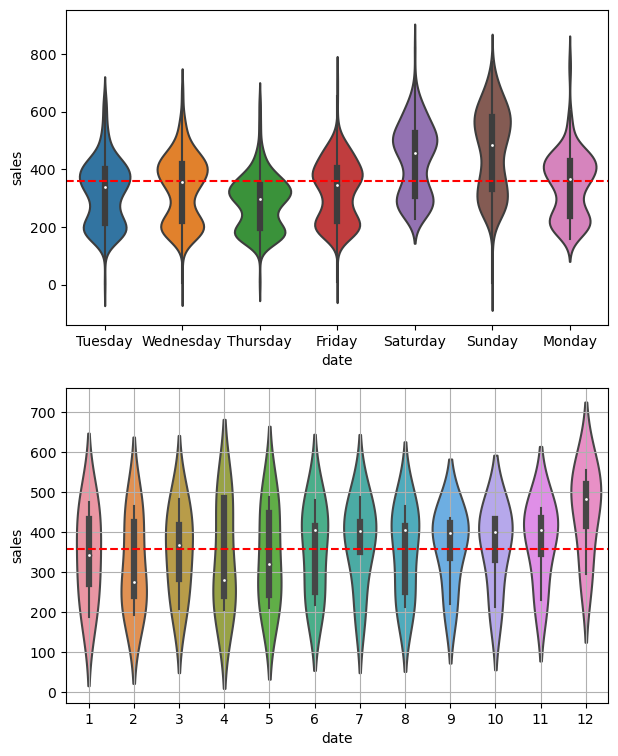

In [94]:
# violinplot of days of week and month to determine variance and range

days_of_week = Daily_sales['sales'].index.day_name()

fig,axes = plt.subplots(2,1,figsize = (7, 9))
sns.violinplot(x=days_of_week, y=Daily_sales['sales'], ax=axes[0])
axes[0].axhline(Daily_sales['sales'].mean(), color='red', linestyle='--')

sns.violinplot(x=monthly_sales.index.month, y=monthly_sales['sales'], ax = axes[1])
axes[1].axhline(monthly_sales['sales'].mean(), color='red', linestyle='--')
plt.grid(True)
plt.show()

In [95]:
autocorr_values = Daily_sales['sales'].autocorr()
print("Autocorrelation:", autocorr_values)

Autocorrelation: 0.7661203554360478


In [96]:
daily_sales = Daily_sales.asfreq('D')
daily_sales[daily_sales.isnull().any(axis=1)]

,id,store_nbr,family,sales,onpromotion
date,,,,,
2013-12-25,NaN,NaN,NaN,NaN,NaN
2014-12-25,NaN,NaN,NaN,NaN,NaN
2015-12-25,NaN,NaN,NaN,NaN,NaN
2016-12-25,NaN,NaN,NaN,NaN,NaN


In [97]:
daily_sales = daily_sales.asfreq('D')
daily_sales['sales'] = daily_sales['sales'].fillna(0)
daily_sales['onpromotion'] = daily_sales['onpromotion'].fillna(0)
daily_sales.isna().sum()

id             4
store_nbr      4
family         4
sales          0
onpromotion    0
dtype: int64

In [98]:
import statsmodels.tsa.stattools as ts
def dftest(timeseries):
    dftest = ts.adfuller(timeseries,) #call function adfuller 
    dfoutput = pd.Series(dftest[0:4],  
                         index=['Test Statistic','p-value','Lags Used','Observations Used'])
    
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput) #5th value is the CV
    
dftest(daily_sales.sales)

Test Statistic            -2.571414
p-value                    0.099051
Lags Used                 22.000000
Observations Used       1665.000000
Critical Value (1%)       -3.434284
Critical Value (5%)       -2.863277
Critical Value (10%)      -2.567695
dtype: float64


In [99]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
# define helper plot function for visualization

def plots(data, lags=None):
    plt.figure(figsize=(15, 4))
    layout = (1, 3)
    raw  = plt.subplot2grid(layout, (0, 0))
    acf  = plt.subplot2grid(layout, (0, 1))
    pacf = plt.subplot2grid(layout, (0, 2))
    
    raw.plot(data)
    plot_acf(data, lags=lags, ax=acf, zero=False)
    plot_pacf(data, lags=lags, ax=pacf, zero = False)
    sns.despine()
    plt.tight_layout()

C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



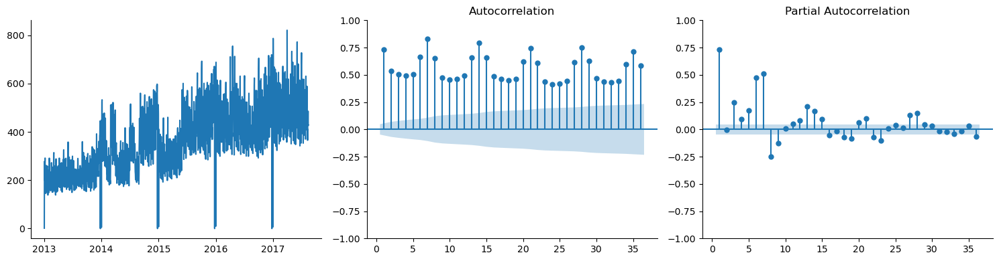

In [100]:
plots(daily_sales['sales'], lags = 36)

C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



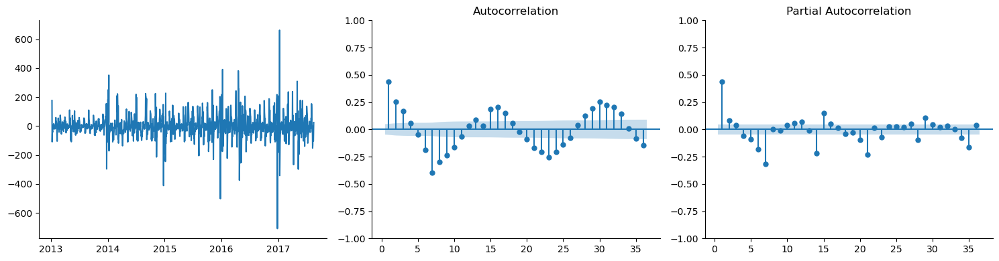

In [101]:
daily_sales['weekly_diff'] = daily_sales['sales'].diff(7)
plots(daily_sales.weekly_diff.dropna(), lags=36);

In [102]:
dftest(daily_sales.weekly_diff.dropna())

Test Statistic         -1.274640e+01
p-value                 8.721279e-24
Lags Used               2.200000e+01
Observations Used       1.658000e+03
Critical Value (1%)    -3.434300e+00
Critical Value (5%)    -2.863285e+00
Critical Value (10%)   -2.567699e+00
dtype: float64


-value is so small we can be sure that it doesn't have unit root I(1). So we know that D = 1, m = 7 as weekly differencing and after that we have stationarity.

# Prophet

# Prophet Model

In [103]:
data = pd.DataFrame()
data['y'] = Daily_sales['sales']  # Observed value column
data = data.reset_index()
data = data.rename(columns={'date': 'ds'})
data

,ds,y
0,2013-01-01,1.409438
1,2013-01-02,278.390807
2,2013-01-03,202.840197
3,2013-01-04,198.911154
4,2013-01-05,267.873244
...,...,...
1683,2017-08-11,463.733851
1684,2017-08-12,444.798280
1685,2017-08-13,485.768618
1686,2017-08-14,427.004717


In [104]:
!pip install prophet


In [105]:
data

,ds,y
0,2013-01-01,1.409438
1,2013-01-02,278.390807
2,2013-01-03,202.840197
3,2013-01-04,198.911154
4,2013-01-05,267.873244
...,...,...
1683,2017-08-11,463.733851
1684,2017-08-12,444.798280
1685,2017-08-13,485.768618
1686,2017-08-14,427.004717


In [106]:
from prophet import Prophet

m = Prophet()
m.fit(data)

2023-09-13 18:18:52,156 - INFO     - Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
18:18:52 - cmdstanpy - INFO - Chain [1] start processing
2023-09-13 18:18:52,500 - INFO     - Chain [1] start processing
18:18:53 - cmdstanpy - INFO - Chain [1] done processing
2023-09-13 18:18:53,305 - INFO     - Chain [1] done processing


In [107]:
# Make prediction

future1 = m.make_future_dataframe(periods=0)
forecast1 = m.predict(future1)
forecast1[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
daily_sales['forecast_2.1'] = forecast1['yhat'].values

In [108]:
# future1 = m.make_future_dataframe(periods=365)
# forecast1 = m.predict(future1)
# forecast1[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
# daily_sales['forecast_2.1'] = forecast1['yhat'].values

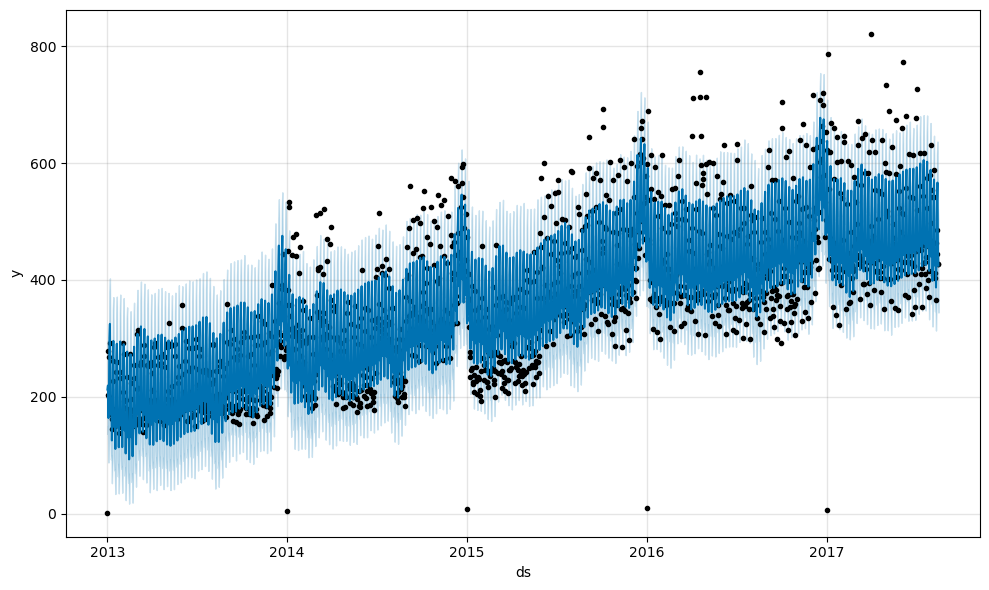

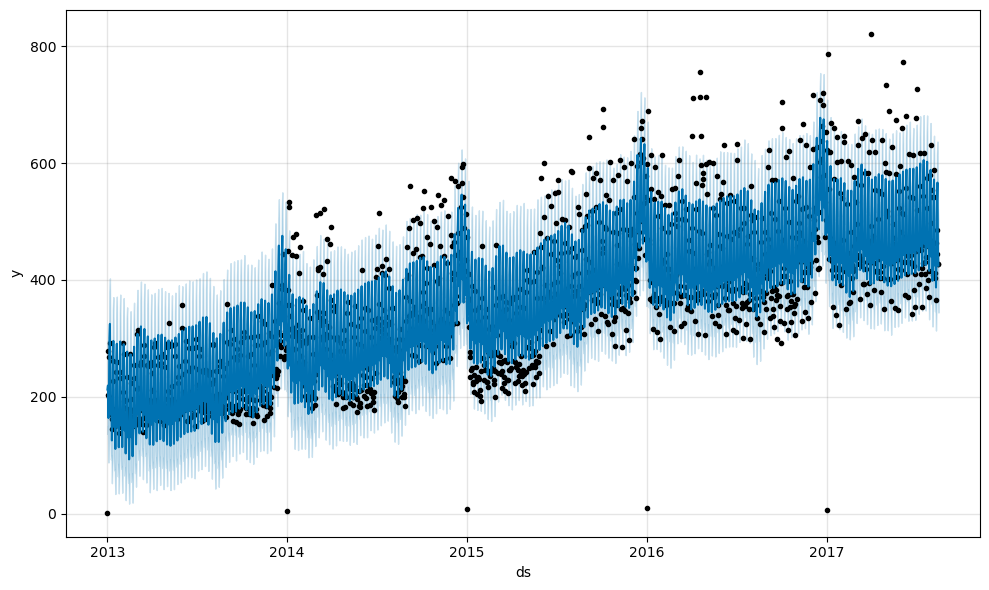

In [109]:
m.plot(forecast1)

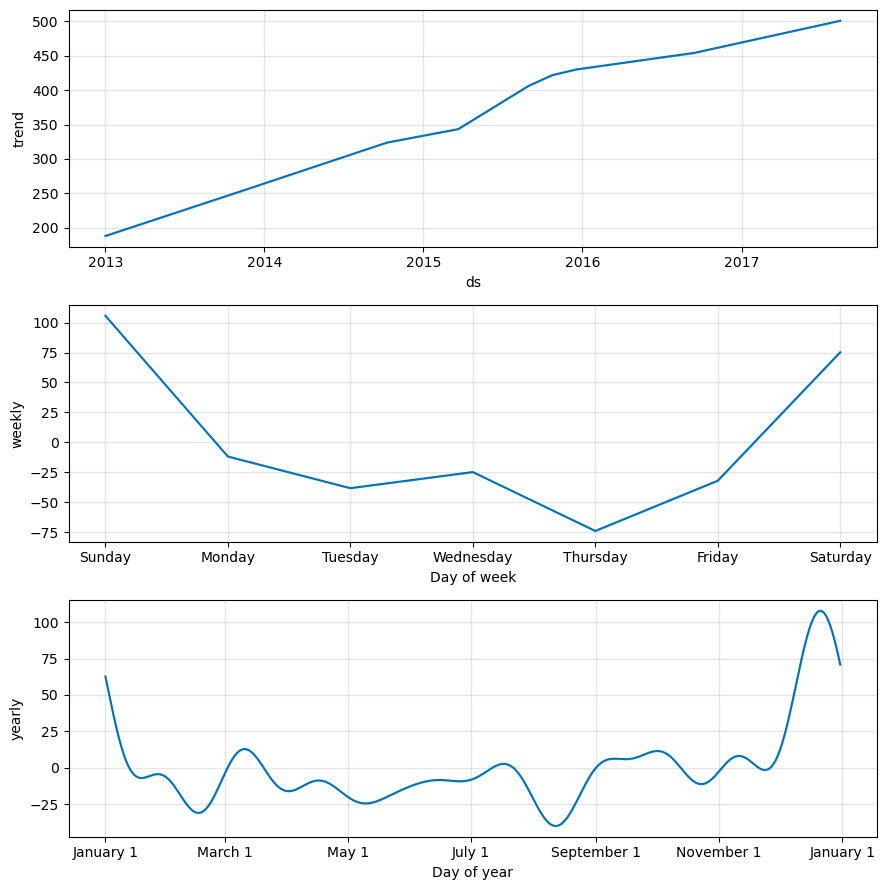

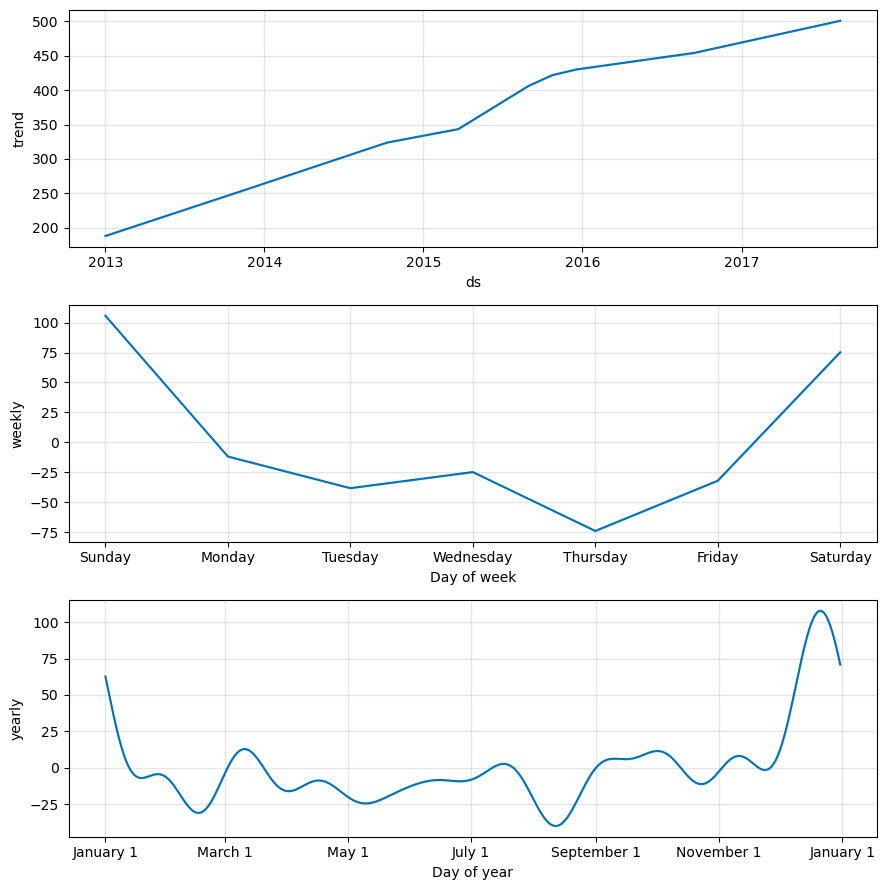

In [110]:
m.plot_components(forecast1)

In [111]:
# Fit model
from prophet import Prophet

m = Prophet()


m.fit(data)

2023-09-13 18:19:00,538 - INFO     - Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
18:19:01 - cmdstanpy - INFO - Chain [1] start processing
2023-09-13 18:19:01,006 - INFO     - Chain [1] start processing
18:19:01 - cmdstanpy - INFO - Chain [1] done processing
2023-09-13 18:19:01,922 - INFO     - Chain [1] done processing


In [112]:
# Make prediction
future = m.make_future_dataframe(periods=0)

forecast = m.predict(future)
print(forecast.columns)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'weekly', 'weekly_lower', 'weekly_upper', 'yearly', 'yearly_lower',
       'yearly_upper', 'multiplicative_terms', 'multiplicative_terms_lower',
       'multiplicative_terms_upper', 'yhat'],
      dtype='object')


,ds,yhat,yhat_lower,yhat_upper
1683,2017-08-11,428.601379,351.655163,512.012038
1684,2017-08-12,535.782229,456.206805,611.005251
1685,2017-08-13,566.590229,485.703070,643.009071
1686,2017-08-14,449.712725,366.599903,531.239258
1687,2017-08-15,424.333302,346.167163,506.216726


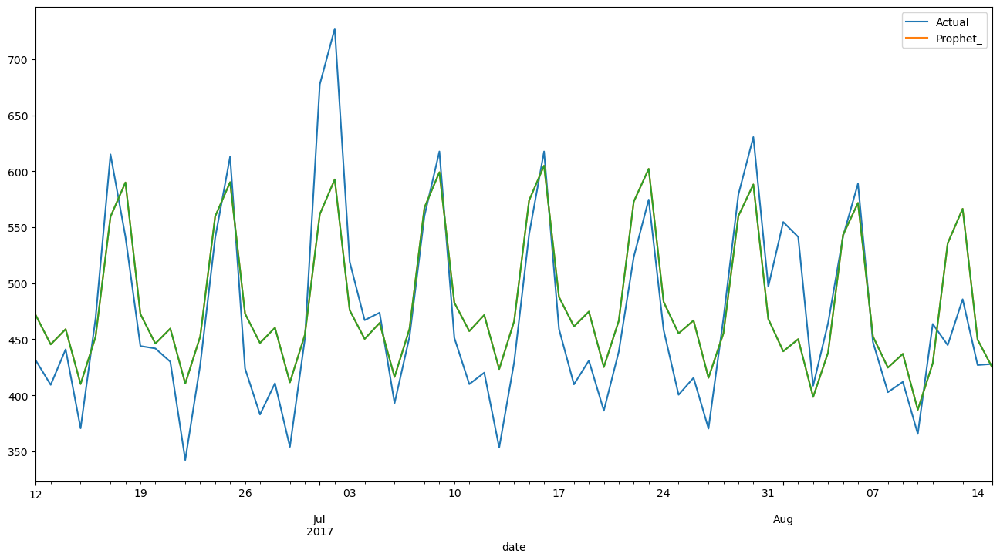

In [113]:
daily_sales['forecast_2.2'] = forecast['yhat'].values
fig, ax = plt.subplots(figsize=(16, 8))
daily_sales[1623:][['sales', 'forecast_2.1', 'forecast_2.2']].plot(ax=ax);
plt.legend(['Actual', 'Prophet_'])
plt.show()

It looks like Prophet prediction WITH exogenous variables gives slightly better forecasts than the other. Let's see which model in three here performs better.

###  For the last 60 days, it seems like Prophet with exogenous variables performs slightly better than the other, but notice that it also depends on the chosen period.

###  And surprisingly SARIMA beats both of them :)))


# visualization

In [114]:
from prophet.plot import plot_plotly, plot_components_plotly

In [115]:

plot_plotly(m ,forecast1)

# Future Forecasting

In [116]:
# Prepare data
data = pd.DataFrame()
data = daily_sales.copy()
data = data.reset_index()
data = data.rename(columns={'sales': 'y'})
data = data.rename(columns={'date': 'ds'})
data = data[['ds', 'y']]

In [117]:
# Fit model
from prophet import Prophet

m = Prophet()


m.fit(data)

2023-09-13 18:19:13,508 - INFO     - Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
18:19:13 - cmdstanpy - INFO - Chain [1] start processing
2023-09-13 18:19:13,821 - INFO     - Chain [1] start processing
18:19:14 - cmdstanpy - INFO - Chain [1] done processing
2023-09-13 18:19:14,228 - INFO     - Chain [1] done processing


In [118]:
# Create a dataframe with future dates for forecasting
future = m.make_future_dataframe(periods=365) 
# Generate forecasts
forecast = m.predict(future)

# Access the "yhat" column from the forecast
daily_sales['forecast_2.2'] = forecast['yhat']  

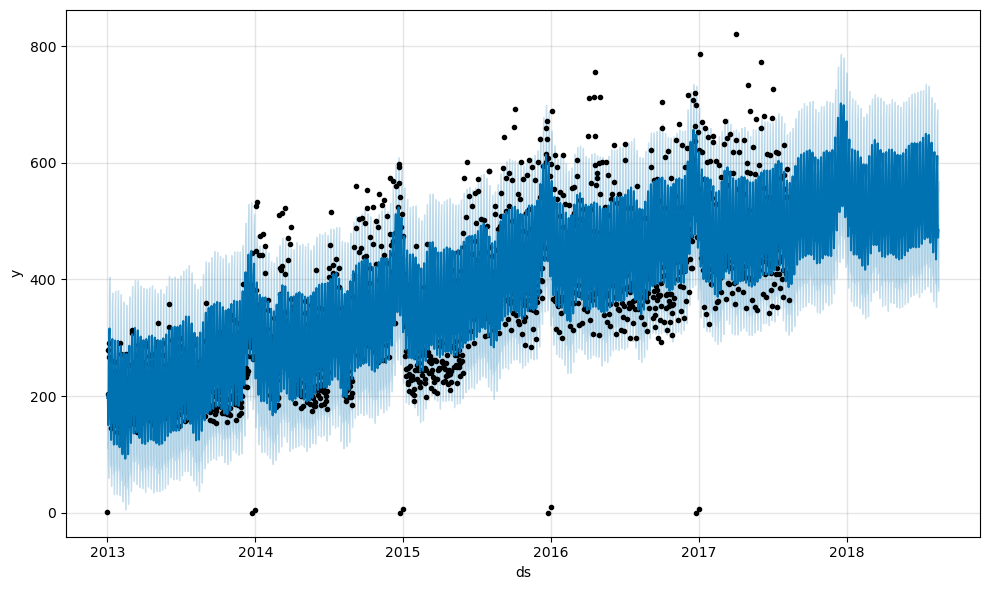

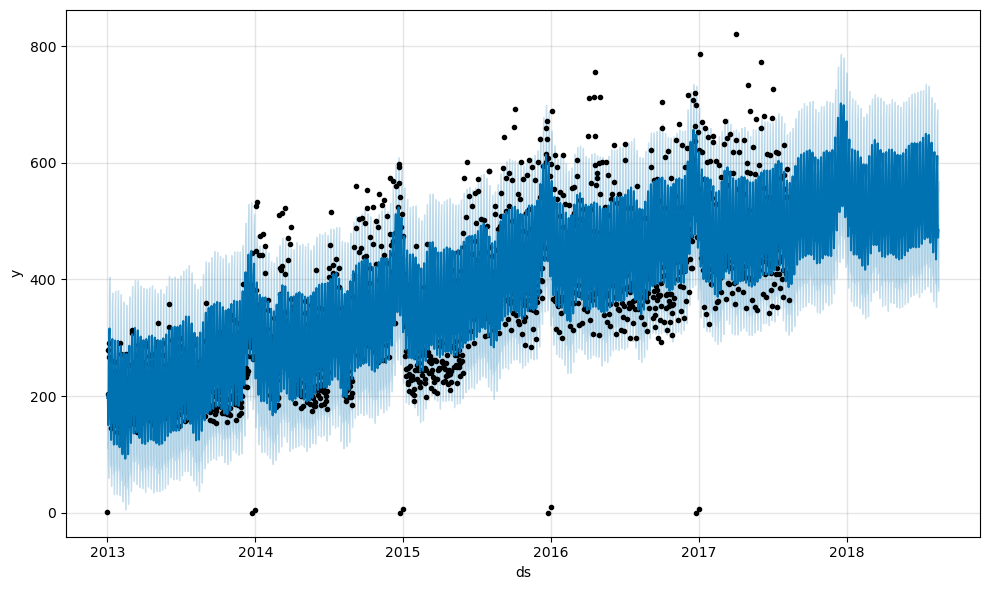

In [119]:
m.plot(forecast)

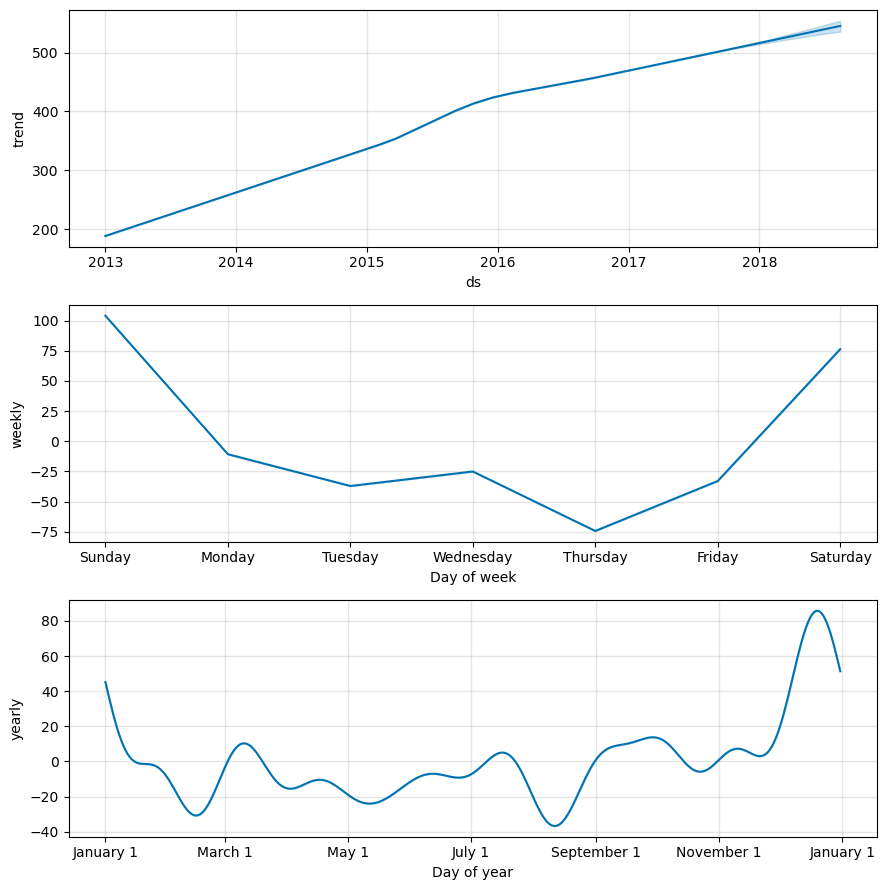

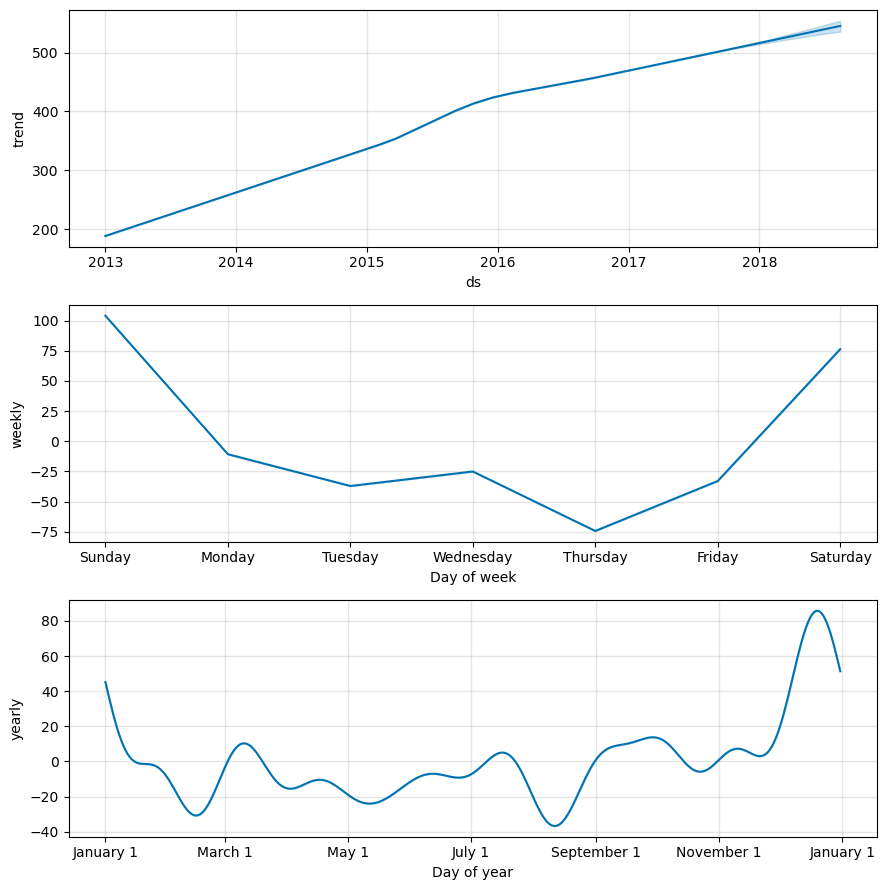

In [120]:
m.plot_components(forecast)

In [121]:
plot_plotly(m ,forecast)

In [122]:
data=pd.read_csv('train.csv')

# Final  Model Building

In [123]:
data

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [124]:
data2 = data.set_index('date')

In [125]:
data2

,id,store_nbr,family,sales,onpromotion
date,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.000,0
2013-01-01,1,1,BABY CARE,0.000,0
2013-01-01,2,1,BEAUTY,0.000,0
2013-01-01,3,1,BEVERAGES,0.000,0
2013-01-01,4,1,BOOKS,0.000,0
...,...,...,...,...,...
2017-08-15,3000883,9,POULTRY,438.133,0
2017-08-15,3000884,9,PREPARED FOODS,154.553,1
2017-08-15,3000885,9,PRODUCE,2419.729,148


<AxesSubplot:xlabel='date'>

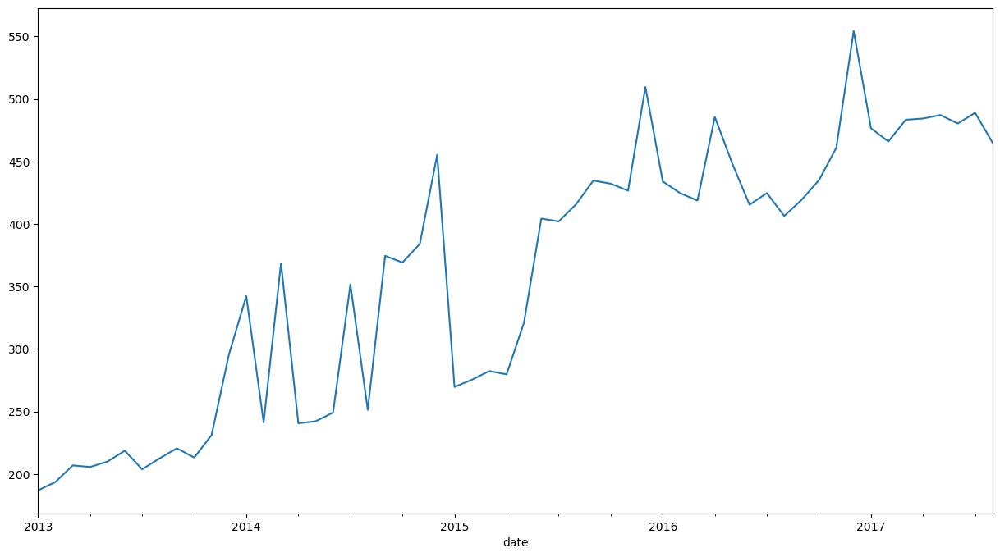

In [126]:
plt.figure(figsize=(15,8))
monthly_sales['sales'].plot()

In [127]:
data1_week = train.resample('W').sum()

<AxesSubplot:xlabel='date'>

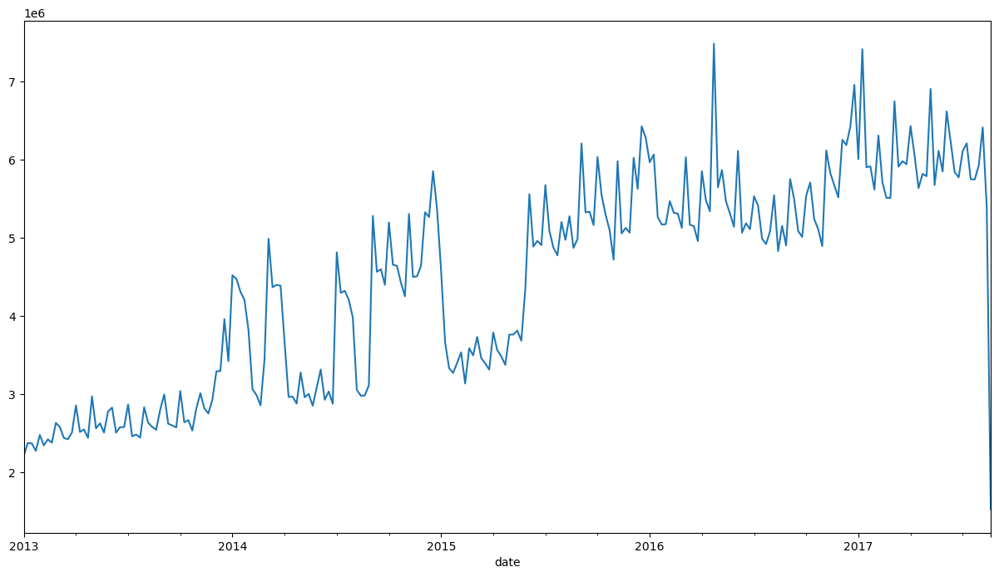

In [128]:
plt.figure(figsize=(15,8))
data1_week['sales'].plot()

In [129]:
smax_data = data.drop(['id', 'store_nbr', 'family', 'onpromotion'], axis=1)
smax_data = smax_data.set_index('date')
smax_data

,sales
date,
2013-01-01,0.000
2013-01-01,0.000
2013-01-01,0.000
2013-01-01,0.000
2013-01-01,0.000
...,...
2017-08-15,438.133
2017-08-15,154.553
2017-08-15,2419.729


In [130]:
smax_data


,sales
date,
2013-01-01,0.000
2013-01-01,0.000
2013-01-01,0.000
2013-01-01,0.000
2013-01-01,0.000
...,...
2017-08-15,438.133
2017-08-15,154.553
2017-08-15,2419.729


In [131]:
weekly_data=train.resample('W').sum()//100

In [132]:
# drop columns
weekly_data.drop(['id', 'store_nbr', 'onpromotion'], axis=1, inplace=True)

In [133]:
weekly_data

,sales
date,
2013-01-06,22115.0
2013-01-13,23736.0
2013-01-20,23680.0
2013-01-27,22721.0
2013-02-03,24768.0
...,...
2017-07-23,57443.0
2017-07-30,59218.0
2017-08-06,64101.0


# Weekly Sales

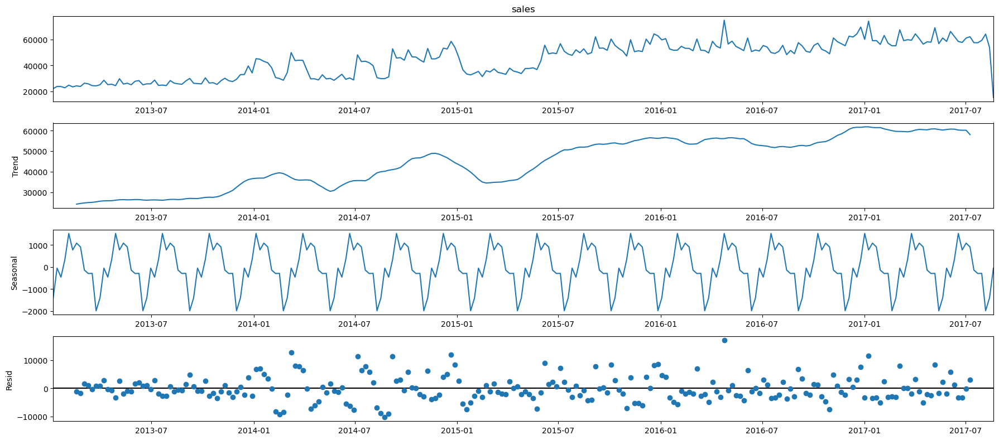

In [134]:
decompose_ts_add = seasonal_decompose(weekly_data.sales,period=12) #period 12 is 
decompose_ts_add.plot()
plt.show()

# Monthly Sales

<Figure size 2000x1000 with 0 Axes>

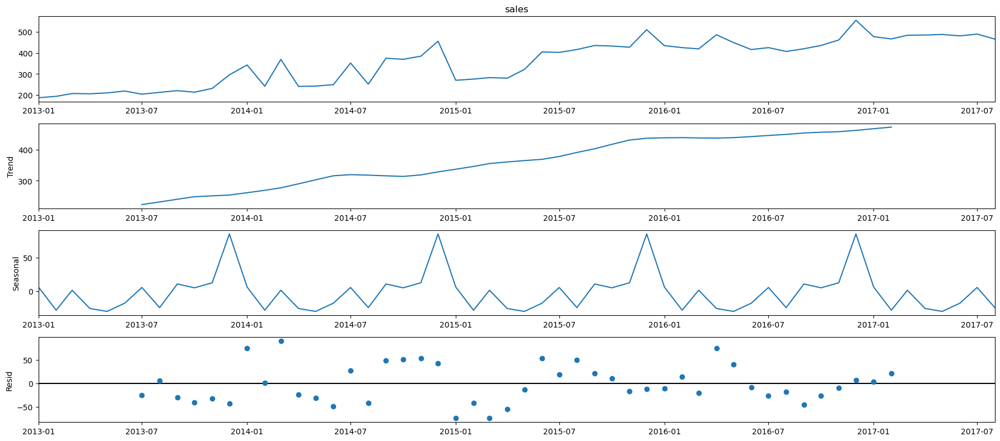

In [135]:
plt.figure(figsize=(20,10))
decompose_ts_add = seasonal_decompose(monthly_sales.sales,period=12) #period 12 is 
decompose_ts_add.plot()
plt.show()

In [136]:
weekly_data = weekly_data.iloc[:241]
weekly_data

,sales
date,
2013-01-06,22115.0
2013-01-13,23736.0
2013-01-20,23680.0
2013-01-27,22721.0
2013-02-03,24768.0
...,...
2017-07-16,57485.0
2017-07-23,57443.0
2017-07-30,59218.0


In [137]:
from sklearn.model_selection import train_test_split

train, test= train_test_split(weekly_data, train_size=0.8, shuffle=False)

C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



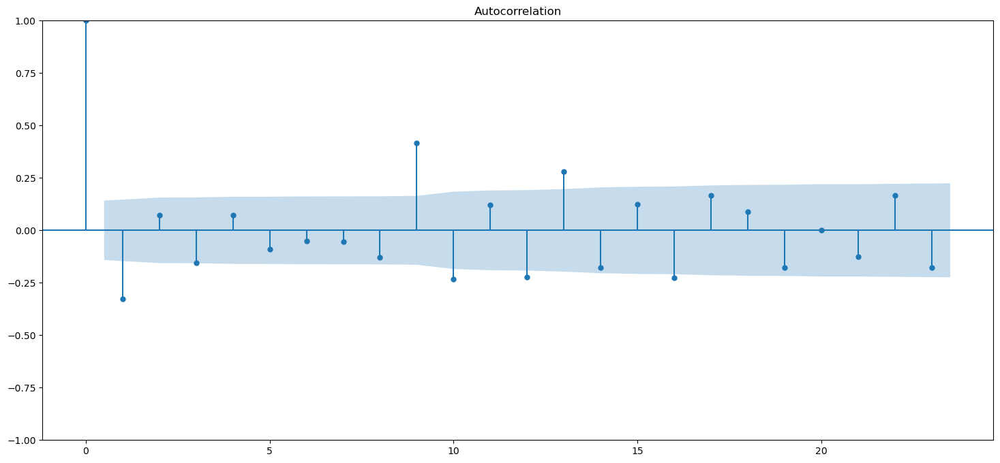

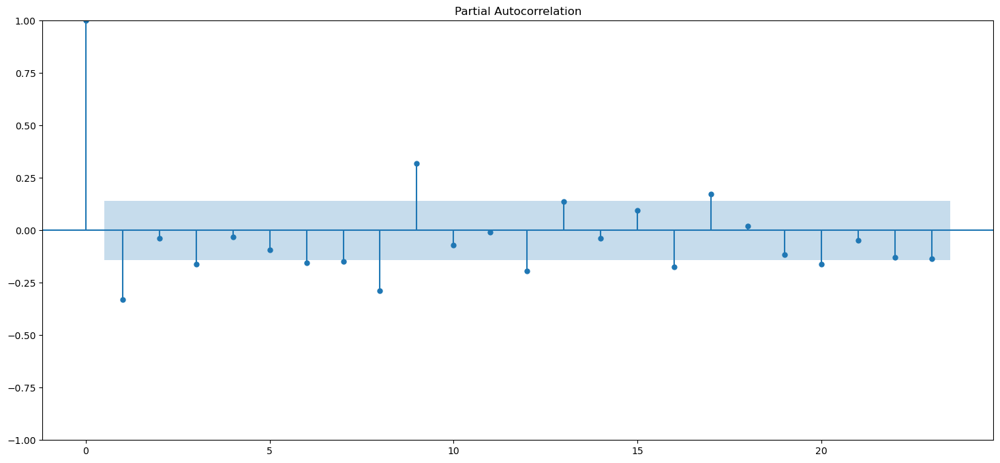

In [138]:
plot_acf(train.diff().dropna())
plot_pacf(train.diff().dropna())
plt.show()

In [139]:
sarimax_model = SARIMAX(train, order=(1,1,1), seasonal_order=(1,1,1,66))
sarimax_fit = sarimax_model.fit()
sarimax_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                  192
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 66)   Log Likelihood               -1270.908
Date:                            Wed, 13 Sep 2023   AIC                           2551.816
Time:                                    18:20:04   BIC                           2565.957
Sample:                                01-06-2013   HQIC                          2557.560
                                     - 09-04-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1346      0.524     -0.257      0.798      -1.162       0.893
ma.L1         -0.2811      0.496     -0.567      0.571      -1.252       0.690
ar.S.L66      -0.3560      0.267     -1.335      0.182      -0.879       0.167
ma.S.L66      -0.4070      0.356     -1.143      0.253      -1.105       0.291
sigma2      5.271e+07   2.31e-08   2.29e+15      0.000    5.27e+07    5.27e+07
===================================================================================
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                51.92
Prob(Q):                              0.76   Prob(JB):                         0.00
Heteroskedasticity (H):               1.05   Skew:                             1.02
Prob(H) (two-sided):                  0.87   Kurtosis:                         5.42
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.86e+30. Standard errors may be unstable.
"""

In [140]:
predict_sarima = sarimax_fit.predict(start=len(train['sales']), end=len(train['sales'])+len(test['sales'])-1)
predict_sarima.index=test.index

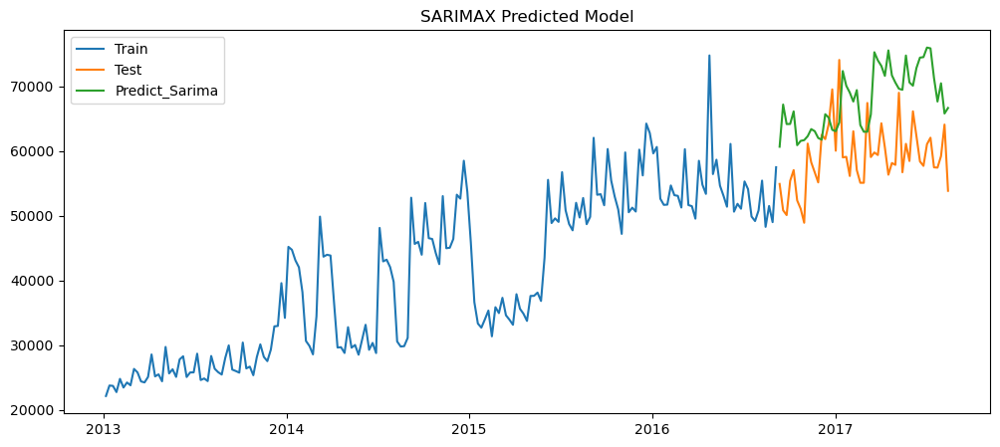

Rmse of Auto Arima : 115641037.38435109
Mape of Auto Arima : 0.16729019250310348


In [141]:
plt.figure(figsize=(12,5))
plt.plot(train['sales'], label='Train')
plt.plot(test['sales'], label='Test')
plt.plot(predict_sarima, label='Predict_Sarima')
plt.title('SARIMAX Predicted Model')
plt.legend()
plt.show()

rmse_of_SARIMAX = mean_squared_error(y_true= test, y_pred= predict_sarima)
mape_of_SARIMAX = mean_absolute_percentage_error(y_true= test, y_pred=predict_sarima)
print('Rmse of Auto Arima :',rmse_of_SARIMAX)
print('Mape of Auto Arima :',mape_of_SARIMAX)

In [142]:
future_dates = pd.date_range(start=test['sales'].index[-1], periods=30, freq='W')
weekly_forecast = sarimax_fit.predict(start=len(train['sales'])+len(test['sales']), end=len(train['sales'])+len(test['sales'])+30, dynamic=True)
weekly_forecast

2017-08-20    66905.274123
2017-08-27    65092.209447
2017-09-03    66366.582503
2017-09-10    68156.389781
2017-09-17    67088.090527
2017-09-24    66869.423495
2017-10-01    66384.477932
2017-10-08    68398.429527
2017-10-15    69201.839441
2017-10-22    69387.966655
2017-10-29    68772.057234
2017-11-05    68320.070235
2017-11-12    70999.768224
2017-11-19    68489.723842
2017-11-26    67951.717721
2017-12-03    66593.380868
2017-12-10    71466.808661
2017-12-17    79030.366038
2017-12-24    80691.390062
2017-12-31    79027.169387
2018-01-07    78839.854671
2018-01-14    82831.084351
2018-01-21    77369.090198
2018-01-28    77039.017684
2018-02-04    76766.048795
2018-02-11    78673.271060
2018-02-18    78567.663777
2018-02-25    79439.445092
2018-03-04    77317.162485
2018-03-11    77551.585784
2018-03-18    84441.616593
Freq: W-SUN, Name: predicted_mean, dtype: float64

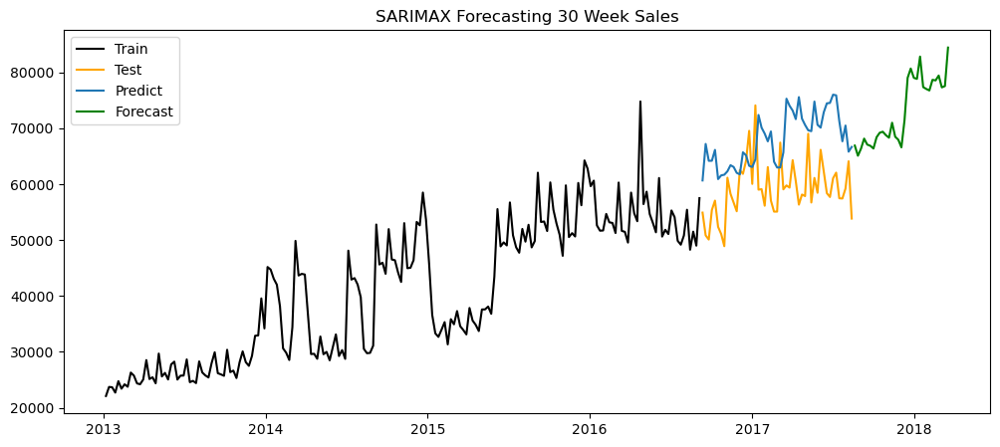

In [143]:
# Plot the predicted values
plt.figure(figsize=(12,5))
plt.plot(train.index, train["sales"], label='Train',color="black")
plt.plot(test.index, test["sales"], label='Test',color="orange")
plt.plot(predict_sarima, label='Predict')
plt.title('SARIMAX Forecasting 30 Week Sales')

plt.plot(weekly_forecast, label='Forecast',color="Green")
plt.legend()
plt.show()

In [144]:
import pickle


In [145]:
pickle.dump(sarimax_fit,open('Deploy.pkl','wb'))